# Проект 10. Рынок заведений общественного питания Москвы.

**Проект заказан** инвесторами фонда «Shut Up and Take My Money». Они решили открыть заведение общественного питания в Москве.   
Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.         
В приоритете у заказчика - возможность открыть в Москве такую же крутую и доступную кофейню, как «Central Perk» из сериала «Друзья».

**Цель проекта:**                         
Провести исследование рынка объектов общественного питания Москвы (и в особенности кофеен), найти интересные особенности и дать заказчикам рекомендации, которые помогут им в выборе места и формата отрываемого заведения.

**Задачи, решаемые в ходе проекта:**                   
• изучить количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее,               
• узнать количество посадочных мест в объектах общественного питания и их часы работы,             
• определить значения средних чеков заведений,                
• провести разбиение на сетевые и индивидуальные точки общественного питания, определить наиболее популярные сети,              
• изучить распределение объектов по административным районам Москвы.

**Данные для проекта** представлены в виде датасета с параметрами объектов общественного питания Москвы, составленного на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

**Этапы проекта** представлены в виде шагов в [оглавлении](#content).

**Результатами проекта** являются выводы, раскрывающие закономерности и особенности рынка общественного питания в Москве (с более подробным описанием рынка кофеен) и рекомендации заказчикам по возможному месту и формату новой точки общественного питания. Результаты необходимо оформить в виде презентации (в формате .pdf). 


### Оглавление <a id='content'></a>:

#### [ Шаг 1. Загрузка данных и изучение общей информации ](#step_1)

#### [ Шаг 2. Предобработка данных ](#step_2)

#### [ Шаг 3. Исследование рынка общественного питания Москвы ](#step_3)

#### [ Общие выводы по результатам исследования ](#conclusions)

#### [ Шаг 4. Детализация рынка кофеен ](#step_4)

#### [ Рекомендации по открытию кофейни ](#recommendations)

#### [ Презентация результатов исследования](#presentation)
    

## Шаг 1. Загрузка данных и изучение общей информации <a id='step_1'></a>

### Импорт библиотек <a id='step_1.1'></a>

Импортируем библиотеки, которые по всей видимости будут нужны 

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go


from folium import Map, Marker # импортируем карту и маркер
from folium.plugins import MarkerCluster # импортируем кластер
from folium import Map, Choropleth # импортируем карту и хороплет

### Общая информация о данных <a id='step_1.2'></a>

Судя по описанию - в датафрейме довольно много столбцов и названия в них довольно длинные. Поэтому перед работой снимем ограничения на вывод по количеству и ширине столбцов.

In [2]:
# снимаем ограничение на количество столбцов
pd.set_option('display.max_columns', False)

# задаем формат вывода столбцов полностью
pd.set_option('display.max_colwidth', False)

В соответствии с описанием проекта весь имеющийся у нас набор данных находится в одном датасете moscow_places.csv, в котором 14 столбцов с различными параметрами заведений общественного питания.

Прочтем исходный файл с данными     
(try...except для того, чтобы можно было читать файл не только локально, но и из общего хранилища). 

In [3]:
try:
    data = pd.read_csv('moscow_places.csv', sep=',')
        
except:
    data = pd.read_csv('/datasets/moscow_places.csv', sep=',')

Посмотрим общую информацию о датафрейме:           
сколько строк в столбцах, много ли пропусков и в каких столбцах, какие у данных типы и насколько это совпадатет с сутью cамих данных.           
А так-же взглянем как выглядят "голова" и "хвост" датафрейма.

In [4]:
# смотрим как выглядит начало и конец датафрейма
display(data.head(), data.tail())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0


In [5]:
# смотрим что из себя представляют данные в датафрейме
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
# смотрим есть ли дублированные строки - стопроцентные дубликаты
data.duplicated().sum()

0

In [7]:
# смотрим количество уникальных значений в столбцах
data.nunique()

name                 5614
category             8   
address              5753
district             9   
hours                1307
lat                  8209
lng                  8258
rating               41  
price                4   
avg_bill             897 
middle_avg_bill      230 
middle_coffee_cup    96  
chain                2   
seats                229 
dtype: int64

<div style="border:solid #d9d9d9 2px; padding: 10px">  
    
**Видим:** 

1. Данные представлены в виде таблицы - датафрейма, включающего в себя 8406 строк и 14 столбцов.
    
2. Количество и названия столбцов совпадает с описанием проекта, то есть можем утверждать, что в соответствии с описанием датафрейм содержит следующие столбцы - характеристики конкретных объектов общественного питания:                          
    •	name — название заведения;                   
    •	category — категория заведения, например «кафе», «пиццерия» или «кофейня»;            
    •	address — адрес объекта;                
    •	district — административный район, в котором находится объект;               
    •	hours — информация о днях и часах работы;                    
    •	lat — широта географической точки, в которой находится объект;               
    •	lng — долгота географической точки, в которой находится объект;                     
    •	rating — рейтинг заведения по оценкам пользователей в Яндекс Картах;             
    •	price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;           
    •	avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;              
    •	middle_avg_bill — число с оценкой среднего чека (только для значений «Средний счёт» из столбца avg_bill);             
    •	middle_coffee_cup — число с оценкой одной чашки капучино (только для значений «Цена чашки капучино» из столбца                   avg_bill);                          
    •	chain —  индикатор того, является ли заведение сетевым;                                    
    •	seats — количество посадочных мест.                         

3. Типы данных, продекларированные в Dtype на взгляд вскидку соответствуют сути данных. С точки зрения типов данных внимания заслуживают только два столбца:                  
    Столбец "chain" содержит индикатор того, является ли заведение сетевым, он содержит два разных значения и по всей видимости хорошо бы заменить тип данных в нем на bool;     
    Столбец "seats" содержит данные о количестве посадочных мест, то есть целочисленные значения. Значит здесь тип должен быть изменен на int64;
    Во всех остальных столбцах по всей видимости тип данных менять не нужно.
          

4. Датафрейм содержит 8406 строк - собственно точек общественного питания.     
    При этом уникальных названий заведений 5614, что скорее всего говорит о том, что среди восьми тысяч представленных точек питания заметную долю занимают сетевые объекты.             
    Из 8406 заполненных строк в колонке адреса уникальных всего 5753, что по всей видимости значит, что многие заведения расположены "кустами" в бизнес- и торговых центрах. 
    Уникальных значений координат объектов гораздо больше, чем уникальных адресов, что наверное свидетельствует о большой точности геолокации (различные метки даже в пределеах одних и тех же торговых и бизнес центров).       
    Количество уникальных значений столбца "district" равно 9, что соответствует количеству административных округов г.Москвы.   
    
    Данные о количестве посадочных мест даны только для 4795 из 8406-ти точек питания. Пока непонятно, насколько серьезно отсутствие этой информации может повлиять на качество анализа.
    Столбцы с ценовыми парметрами заведений (ценовой категорией, средним чеком или стоимостью чашки кофе или бокала пива) заполнены меньше чем в половине случаев, что будет негативно влиять на качество анализа. Возможно частично эта "нехватка информации" будет устранена за счет сетевых заведений, но только частично.
    
5. В завершение заметим, что в данном случае смотреть на основные численные параметры датафрейма есть смысл только для столбцов с рейтингом, количеством посадочных мест и с ценовыми парметрами. Остальные числовые данные являются координатами и их обработка при помощи метода describe() бессмысленна. 

### Детализация отдельных столбцов <a id='step_1.3'></a>

Проверим здесь же **корректность и особенности значений столбцах**, которые мы можем сразу "на глаз" проверить на разумность и возможные проблемы,      
а именно: 
- названия заведений (есть ли какие-нибудь особенности),
- наименования категорий (уникальных категорий 8),               
- названия округов Москвы (их 9 в датасете, а официально в Москве их на сегодня 12),              
- значения индикатора в столбце "chain" (уникальных 2), 
- значения ценовых сегментов в столбце "price" (уникальных 4),
- диапазон рейтинга ( в описании он декларирован от 0 до 5),
- минимальное и максимальное количество посадочных мест.

In [8]:
# делаем несколько разных выборок названий и смотрим есть ли какие-нибудь особенности
data['name'].sample(10)

3397    Molon Lave           
3717    Soluxe Club          
7223    Кларом               
507     Кафе                 
7861    Кафе быстрого питания
6455    Кафе-кафе            
403     Дон Тантуни          
7020    ЛекЛерк              
7371    Звездопад            
734     Завод                
Name: name, dtype: object

In [9]:
# задаем список названий категорий общественного питания
name_cat = ["бар", "буфет", "кафе", "кофейня", "паб", "пиццерия", "ресторан", "столовая", "суши", "фудкорт" \
            "Бар", "Буфет", "Кафе", "Кофейня", "Паб", "Пиццерия", "Ресторан", "Столовая", "Суши", "Фудкорт" ]

# проверяем сколько в датафрейме названий заведений в виде просто слов из нашего списка.
print( data.loc[data['name'].isin(name_cat),'name'].count(), " - названий заведений в виде просто слов - категорий")

276  - названий заведений в виде просто слов - категорий


In [10]:
# проверяем отдельные подозрения относительно присутствия нерелевантных заведений
data[data['name'].str.contains("ндекс")]['name'].head()

162     Яндекс Лавка
193     Яндекс Лавка
212     Яндекс Лавка
836     Яндекс Лавка
1041    Яндекс Лавка
Name: name, dtype: object

<div style="border:solid #d9d9d9 2px; padding: 10px">  
    
При изучении **названий точек общественного питания** можно видеть следующие особенности:  
    
- в датасете в качестве объектов общественного питания встречаются указания на дарксторы компаний, которые занимаются исключительно доставкой еды на дом (через мобильное приложение). Дарксторы представляют собой по сути склады для курьеров доставки и доступ клиентам туда закрыт. Из всех известных нам больших компаний по доставке еды ( Я.Еда, Я.Лавка, Самокат, Сбермаркет, Магнит-Доставка, Впрок, Лента-онлайн и т.п.) в датасете нами найдены "Яндекс.Еда", "Яндекс.Лавка" и "Лента онлайн".
Поскольку эти заведения представляют довольно специфический сегмент заведений общественного питания - по всей видимости на этапе предобработки есть смысл исключить их из рассмотрения;

- заметное количество точек питания имеют в качестве названия просто наименование категории общественного питания: ресторан, кафе и т.п. Таких в датафрейме 274. Потенциально это могут быть неявные дубликаты точек питания "с именем". На этапе предобработки нужно будет уделить этому внимание;
    
- в некоторых названиях кроме самого названия присутствуют различные "ошибочные" или служебные символы: дефисы, точки, апострофы, кавычки, а так-же служебные символы табуляции и перехода на новую строку;
    
    
- ну и естественно чтобы не допускать ошибок при сопоставлении названий нужно будет проверить пару е и ё, а так-же первод в нижний регистр.
    
Эти пункты могут рассматриваться как "планы на предобработку".

In [11]:
# смотрим какие категории представлены в датасете
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Наименования **категорий** вполне логичны и правильны. 
    
Все-таки возникают вопросы                                           
- что представляет собой категоря "булочная" 
- и куда отнести кондитерские и фудкорты в магазинах.             

Пока не видно, чтобы эти вопросы сильно повлияли на наш анализ, поэтому будем предполагать, что эти самые кондитерские и попадают в основном в категорию "булочные", а при возможности - будем уточнять у коллег, предоставивших данные.

In [12]:
# смотрим какие округа Москвы упомянуты в датасете
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Перечислены все **округа Москвы**, за исключением Зеленограда и Новой Москвы.                
Таким образом нужно иметь ввиду, что мы имеем данные по объектам в "старой" Москве (грубо говоря - в пределах МКАД)

In [13]:
# смотрим значения индикатора принадлежности к сети
data['chain'].unique()

array([0, 1], dtype=int64)

**Индикатор сети** (того, является ли заведение сетевым или нет) в соответствии с описанием проекта, действительно имеет два значения:           
    - 1 - признак принадлежности к сети,              
    - 0 - признак того, что заведение не сетевое.   
    
По всей видимости есть смысл на этапе предобработки перевести это индикатор в тип bool.  

In [14]:
# смотрим значения индикатора принадлежности к сети
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

В распределении заведений на **ценовые категории** есть логика (и даже отсутствие категории "ниже среднего" может быть вполне оправданным).  ...  

In [15]:
# смотрим общее количество точек с непонятной ценовой категорией
print(data.query('price.isna()')['name'].count(), " - общее количество объектов без указания ценовой категории",  sep=' ')
      
# смотрим количество уникальных заведений с непонятной ценовой категорией
print(data.query('price.isna()')['name'].nunique(), " - кол-во уникальных заведений без указания ценовой категории",  sep=' ')

# смотрим количество уникальных сетевых заведений с непонятной ценовой категорией
print(data.query('price.isna() and chain == True')['name'].nunique(), \
      " - кол-во уникальных точек сетевых заведений без указания ценовой категории",  sep=' ')

# смотрим количество уникальных заведений с непонятной ценовой категорией но с ненулевым средним чеком
print(data.query('price.isna() and (middle_avg_bill.notna() or middle_coffee_cup.notna())')['name'].nunique(), \
      " - кол-во уникальных заведений без указания ценовой категории но с данными о чеке",  sep=' ')

5091  - общее количество объектов без указания ценовой категории
3311  - кол-во уникальных заведений без указания ценовой категории
611  - кол-во уникальных точек сетевых заведений без указания ценовой категории
442  - кол-во уникальных заведений без указания ценовой категории но с данными о чеке


...
Однако настораживает большое количество **пропусков данных о ценовой категории** ( ведь ценовая категория заведения - это довольно важный параметр) и с возможностью его заполнить 
- либо за счет перноса категории цены с других заведений этой же сети, 
- либо простановкой ценовой категории на основе данных по среднему чеку или по цене чашки капучино.

Здесь же следует отметить, что видится явно нелогичным отсутствие столбца "middle_beer_mug" с ценовыми параметрами чека для пивных заведений. Насколько есть смысл вводить такой столбец пока непонятно с учетом приоритетов заказчика.

In [16]:
# смотрим максимальное и минимальное значения рейтинга
print( "Минимальный рейтинг - ", data['rating'].min(), sep=' ' )
print( "Максимальный рейтинг - ", data['rating'].max(), sep=' ' )

Минимальный рейтинг -  1.0
Максимальный рейтинг -  5.0


**Значения рейтинга** заведений, в полном соответствии с описанием проекта, лежат в диапазоне от 1 до 5.  

In [17]:
# смотрим расклад значений количества посадочных мест
data['seats'].describe()

count    4795.000000
mean     108.421689 
std      122.833396 
min      0.000000   
25%      40.000000  
50%      75.000000  
75%      140.000000 
max      1288.000000
Name: seats, dtype: float64

In [18]:
data.query('seats >= 1000')['name'].count()

16

В среднем в заведениях общественного питаний Москвы 108 **посадочных мест**, однако медиана ниже - 75 мест, при этом есть 16 заведения с 1000+ местами.
В принципе число посадочных мест больше 1000 не представляется чем-то нереальным: большой зал в многолюдном месте или заведение для проведения больших мероприятий. Однако стоит посмотреть чуть внимательнее, поскольку указание такого количества мест может оказаться ошибкой, которая будет влиять на количественные показатели и снижать качество анализа.

Посмотрим чуть подробнее

In [19]:
data.query('seats >= 1000')[['name', 'address', 'chain', 'seats']]

,name,address,chain,seats
2713,Ваня и Гоги,"Москва, Измайловское шоссе, 71, корп. А",0,1040.0
2722,Маргарита,"Москва, Измайловское шоссе, 71, корп. А",1,1040.0
2770,Шоколадница,"Москва, Измайловское шоссе, 71, корп. А",1,1040.0
2966,Матрешка,"Москва, Измайловское шоссе, 71, корп. А",0,1040.0
4231,РестоБар Argomento,"Москва, Кутузовский проспект, 41, стр. 1",0,1200.0
6518,DelonixCafe,"Москва, проспект Вернадского, 94, корп. 1",0,1288.0
6524,Ян Примус,"Москва, проспект Вернадского, 121, корп. 1",1,1288.0
6574,Мюнгер,"Москва, проспект Вернадского, 97, корп. 1",1,1288.0
6641,One Price Coffee,"Москва, проспект Вернадского, 84, стр. 1",1,1288.0
6658,ГудБар,"Москва, проспект Вернадского, 97, корп. 1",0,1288.0


<div style="border:solid #d9d9d9 2px; padding: 10px"> 
    
**Видим:** 
    
    что 16 заведений, в каждом из которых продекларировано больше 1000 посадочных мест  разделяются на несколько явно выраженных групп:          
- РестоБар Argomento - отдельно стоящее (с уникальным в этой выборке адресом) несетевое (с False в столбце 'chain') заведение с уникальным (не таким как у других заведений в выборке) количеством посадочных мест. Его есть смысл оставить без изменений, поскольку никаких явных признаков ошибки в этом случае нет;                                             
- Alternative coffee - отдельно стоящая сетевая (хотя и с ошибочно указанным флажком 0 в столбце 'chain') точка с явно нереальным количеством посадочных мест. Это небольшая точка сети кофеен, в основном торгующая "на вынос". Поскольку точка "живая", а количество мест явно неправильное для нее наверное есть смысл при предобработке поставить NaN в столбце "seats". Качество анализа от этого только выиграет так как у нас количество заведений с неизвестным количеством мест  составляет более 3.5 тысяч. Так-же есть смысл заменить флажок принадлежности к сети на True;                      
- остальные 13 заведений, которые расположены группами в различных порговых и бизнес- центрах и количество мест в которых по всей видимости укзано не для конкретной точки общественного питания, а для всего центра суммарно. Для всех этих заведений так-же есть смысл при предобработке поставить NaN в столбце "seats;                
- Яндекс Лавка на проспекте Вернадского, 51 - одна из точек сети дарксторов сервиса заказа продуктов. Как мы отмечали ранее  будет наиболее резонно на этапе предобработки исключить всю эту сеть из рассмотрения. 
    
На этапе предобработки данных нужно будет проделать вышеназванные преобразования данных по очень большому количеству мест, что (мы надеемся) улучшит качество дальнейшего анализа

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Таким образом:** 

Мы провели первичный анализ имеющихся в нашем распоряжении данных, определили возможные "болевые точки" и наметили шаги по их утранению.              
Будем считать, что **шаг изучения** общей информации мы **завершили** и можем переходить к предобработке.  

## Шаг 2. Предобработка данных <a id='step_2'></a>

### Изменение типов данных <a id='step_2.1'></a>

Как мы отмечали выше с точки зрения типов данных внимания заслуживают только два столбца:
- столбец "chain" в котором хорошо бы заменить тип данных на bool;                
- столбец "seats" в котором нужно установить тип данных int64, поскольку он содержит по сути целочисленное значение количества посадочных мест.

In [20]:
# меняем тип индикатора принадлежности к сети на bool
data['chain'] = data['chain'].astype(bool)

# смотрим что получилось
data['chain'].dtype

dtype('bool')

Индикатор переведен в тип bool и теперь имеет значения:                        
    - True - признак принадлежности к сети,                             
    - False - признак того, что заведение не сетевое.                     

In [21]:
# меняем тип данных в столбце "seats" на int64
data['seats'] = data['seats'].astype('Int64')

# смотрим что получилось
data['seats'].dtype

Int64Dtype()

Количество посадочных мест преведено к целочисленному значению.                     

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Итак:** 
- мы изменили в столбце "chain" тип данных с int на bool;                
- установили в столбце  "seats" целочисленный тип данных Int64.             
Во всех остальных столбцах необходимости в смене типа данных не видно.  

### Преобразование текстовых данных <a id='step_2.2'></a>

Для удобства переведем текстовые данные в столбцах с типом <object> в нижний регистр и удалим "лишние" пробелы в начале и конце (если они есть).

In [22]:
# для каждого текстововго столбца
for col in ['name', 'category', 'address', 'hours', 'price', 'avg_bill']:
    
    # переводим значение в нижний регистр
    data[col] = data[col].str.lower()
    
    # удаляем пробелы в начале и конце
    data[col] = data[col].str.strip()
    
    # удаляем пробелы в начале и конце
    data[col] = data[col].str.replace("ё","е")
    
# смотрим что получилось
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,<NA>
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счет:1500–1600 ₽,1550.0,NaN,False,4
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,средний счет:от 1000 ₽,1000.0,NaN,False,45
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,False,<NA>
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счет:400–600 ₽,500.0,NaN,True,148


<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Итак:** 
- мы перевели текстовые данные в нижний регистр;
- убрали в текстовых столбцах пробелы в начале и в конце;
- заменили ё на е. 
    
Более глубокими преобразованиями в столбце "name"  есть смысл заняться отдельно.

### Очистка названий заведений <a id='step_2.3'></a>

В столбце "name" заменим дефисы, точки и служебные символы \n и \t - на пробелы, а так-же удалим апострофы и кавычки (открывающую и закрывающую), чтобы одни и те же названия, которые сейчас могут казаться разными читались одинаково.

Теперь заменим заменим дефисы, точки, апострофы, и служебные символы \n и \t - на пробелы в названиях заведений

Посмотрим сколько их ...

In [23]:
# смотрим сколько в названиях есть дефис
print(len(data.loc[data['name'].apply(lambda x: x.find("-")) != -1]), " - названий заведений в которых есть дефис")

# смотрим сколько в названиях есть точка
print(len(data.loc[data['name'].apply(lambda x: x.find(".")) != -1]), " - названий заведений в которых есть точка")

# смотрим сколько в названиях есть апостроф
print(len(data.loc[data['name'].apply(lambda x: x.find("'")) != -1]), " - названий заведений в которых есть апостроф")

# смотрим сколько в названиях есть кавычки
print(len(data.loc[data['name'].apply(lambda x: x.find('"')) != -1]), " - названий заведений в которых есть кавычки")

# смотрим сколько в названиях есть табуляция
print(len(data.loc[data['name'].apply(lambda x: x.find("\t")) != -1]), " - названий заведений в которых есть табуляция")

# смотрим сколько в названиях есть переход на новую строку
print(len(data.loc[data['name'].apply(lambda x: x.find("\n")) != -1]), \
      " - названий заведений в которых есть переход на новую строку")

385  - названий заведений в которых есть дефис
95  - названий заведений в которых есть точка
147  - названий заведений в которых есть апостроф
0  - названий заведений в которых есть кавычки
0  - названий заведений в которых есть табуляция
0  - названий заведений в которых есть переход на новую строку


...
проведем замену
...

In [24]:
# заменяем дефис на пробел
data['name'] = data['name'].str.replace("-"," ")

# заменяем точку на пробел
data['name'] = data['name'].str.replace("."," ")

# удаляем апостроф
data['name'] = data['name'].str.replace("'","")

...
проверим все ли заменилось
...

In [25]:
print(len(data.loc[data['name'].apply(lambda x: x.find("-")) != -1]), " - названий заведений в которых есть дефис")
print(len(data.loc[data['name'].apply(lambda x: x.find(".")) != -1]), " - названий заведений в которых есть точка")
print(len(data.loc[data['name'].apply(lambda x: x.find("'")) != -1]), " - названий заведений в которых есть апостроф")

0  - названий заведений в которых есть дефис
0  - названий заведений в которых есть точка
0  - названий заведений в которых есть апостроф


...
и наконец удалим двойные пробелы (в конце - потому что мы могли сами их добавить при предыдущих манипуляциях).

In [26]:
# заменяем двойные пробелы одинарнымми
data['name'] = data['name'].str.replace("  "," ")

# проверяем что их не осталось
print(len(data.loc[data['name'].apply(lambda x: x.find("  ")) != -1]), " - названий заведений в которых есть двойной пробел")

21  - названий заведений в которых есть двойной пробел


<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Итак:** 
    
Мы названия точек питания к более читаемому виду, убрав из названий заведений "лишние" и служебные символы, которые могли внести неоднозначность в прочтение названий.            
Для остальных текстовых столбцов видится, что в такой коррекции нет необходимости.  

### Обработка пропусков  <a id='step_2.4'></a>

Посмотрим количество пропущенных значений по столбцам датафрейма

In [27]:
# смотрим количество пропусков
data.isna().sum()

name                 0   
category             0   
address              0   
district             0   
hours                536 
lat                  0   
lng                  0   
rating               0   
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                0   
seats                3611
dtype: int64

С пропусками данных по часам работы и по количеству посадочных мест мы сделать вряд-ли что-то сможем, поскольку и часы работы и количество мест - это характеристики конкретной точки обслуживания и нами могут рассматриваться как данность.   

В отношении же пропусков ценовых параметров и в частности со столбцом "price" ранее мы выяснили, что:           
Общее количество объектов без указания ценовой категории -  5091,           
Количество уникальных заведений без указания ценовой категории -  3311,                
Количество уникальных точек сетевых заведений без указания ценовой категории -  611,                       
Количество уникальных заведений без указания ценовой категории но с данными о чеке -  442.

Таким образов видится возможность заполнить пропуски в данных с категориями цен в конкретных точках либо на основе данных о среднем чеке/чашке капучино либо для сетевых точек - на основе данных о категории це в других точках сети (в предположении что ценовая политика сети едина).

Сначала посмотрим границы категорий ( их четыре: 'высокие', 'выше среднего', 'средние' и 'низкие').           
...  

In [28]:
# смотрим "размах" для всех категорий

print()
print('      ', 'низкие', 'средние', 'выше среднего', 'высокие')
print(data.query('price == "низкие"')[['middle_avg_bill', 'middle_coffee_cup']].describe())

print()
print('      ', 'средние')
print(data.query('price == "средние"')[['middle_avg_bill', 'middle_coffee_cup']].describe())

print()
print('      ', 'выше среднего')
print(data.query('price == "выше среднего"')[['middle_avg_bill', 'middle_coffee_cup']].describe())

print()
print('      ', 'высокие')
print(data.query('price == "высокие"')[['middle_avg_bill', 'middle_coffee_cup']].describe())


       низкие средние выше среднего высокие
       middle_avg_bill  middle_coffee_cup
count  93.000000        57.000000        
mean   217.311828       136.614035       
std    114.653161       39.306831        
min    90.000000        60.000000        
25%    150.000000       110.000000       
50%    180.000000       139.000000       
75%    250.000000       154.000000       
max    600.000000       256.000000       

       средние
       middle_avg_bill  middle_coffee_cup
count  1668.000000      218.000000       
mean   598.908273       209.403670       
std    294.840114       107.683537       
min    165.000000       60.000000        
25%    350.000000       160.000000       
50%    500.000000       200.000000       
75%    850.000000       255.750000       
max    2150.000000      1568.000000      

       выше среднего
       middle_avg_bill  middle_coffee_cup
count  481.000000       2.000000         
mean   1344.189189      203.000000       
std    226.774410       74.953319  

...  
По цифрам понять какие значения брать за пороговые довольно сложно - категории пересекаются и имеют значительные выбросы.      
Попробуем построить "ящики с усами" и взять пороговые значения на их основе ( предположительно - на границах "усов").    
...

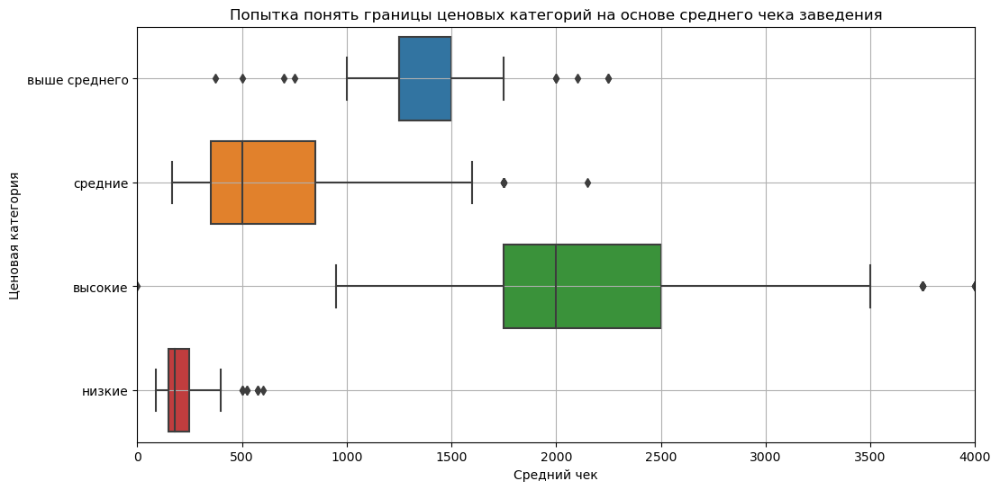

In [29]:
# строим боксплот для категорий в зависимости от среднего чека
plt.figure(figsize=(12, 6))
sns.boxplot(x='middle_avg_bill', y='price', data=data.query('price.notna()')) 
plt.xlabel('Средний чек')
plt.ylabel('Ценовая категория')
plt.xlim(0, 4000)
plt.grid()
plt.title('Попытка понять границы ценовых категорий на основе среднего чека заведения')
plt.show()

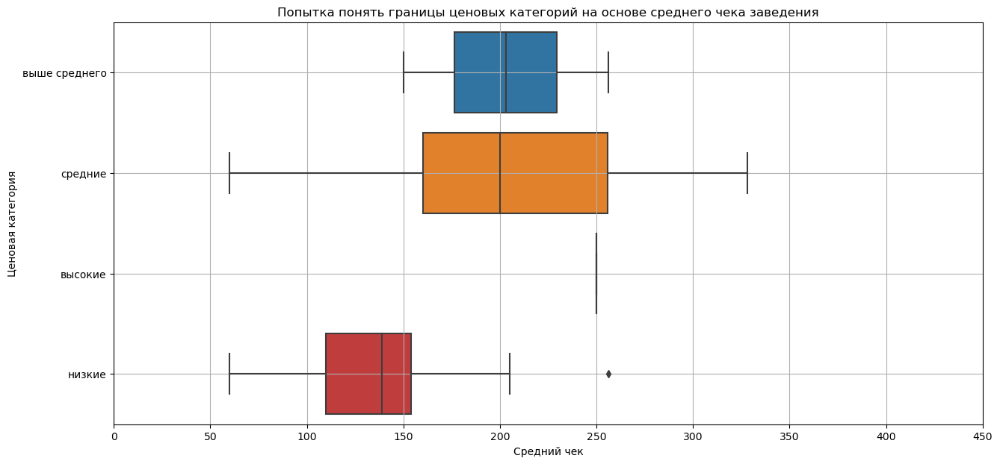

In [30]:
# строим боксплот для категорий в зависимости от цены чашки капучино
plt.figure(figsize=(15, 7))
sns.boxplot(x='middle_coffee_cup', y='price', data=data.query('price.notna()')) 
plt.xlabel('Средний чек')
plt.ylabel('Ценовая категория')
plt.xlim(0, 450)
plt.grid()
plt.title('Попытка понять границы ценовых категорий на основе среднего чека заведения')
plt.show()

<div style="border:solid #d9d9d9 2px; padding: 10px">  

**Итак:**
    
Как мы и предполагали категории сильно пересекаются и изобилуют выбросами, поэтому сделать строгую разбивку не получится (особенно для зависимости от чешки капучино). Разночтение в данных этого столбца слишком большое. 

Поэтому сделаем вывод, что данные из этого столбца не могут рассматриваться как существенные при дальнейшем анализе, а могут рассматриваться только как некая дополнительная информация.           
Поэтому продолжать пытаться корректно заполнить пропуски в этом столбце по всей видимости бессмысленно. 
    
**Прервем это действие и будем считать, что с пропусками мы разобрались.**

### Удаление дубликатов  <a id='step_2.5'></a>

Ранее мы уже убеждались, что строк - полных дубликатов в датафрейме нет

In [31]:
data.duplicated().sum()

0

Однако с учетом обилия разнообразной информации в датафрейме отсутствие полных дубликатов может не означать, что дубликатов действительно нет.         
По сути две записи об объекте общественного питания (строки датафрейма) можно считать дубликатами одного и того же объекта если в строках совпадают название и адрес.        
Хотя теоретически наверное возможно присутствие двух разных точек одной сети в каком-нибудь крупном торговом центре (например несколько локаций на разных этажах или в разных концах центра), но мы будем предполагать, что это дубликаты.

Посмотрим есть ли они и сколько ...

In [32]:
data.duplicated(subset=['name', 'address']).sum()

4

... Взглянем на них подробнее ...

In [33]:
data[data.duplicated(subset=['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,False,<NA>
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,False,<NA>
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,False,188
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,True,188
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,False,150
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,True,150
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,True,276
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,False,276


... Видим, что заведения "кафе..." и "more poke" видятся явными дубликатами, а у "раковарня..." и "хлеб да выпечка" есть отличия в категории, координатах и расписании. Однако как мы и отметили раньше - будем считать их дубликатами, поскольку и название и адрес у них совпадают. 

Удалим эти дубликаты (сохранив только первые упоминания заведений).

In [34]:
# удаляем дубликаты
data.drop_duplicates(subset=['name', 'address'], keep='first', inplace=True)
     
# смотрим что осталось
data.duplicated(subset=['name', 'address']).sum()

0

Эти дубликаты удалены. 

Посмотрим есть ли в датафрейме объекты у которых одинаковые координаты.

In [35]:
data[data.duplicated(subset=['category', 'lat', 'lng'], keep=False)].sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3759,patriki,ресторан,"москва, малая бронная улица, 21/13с2",Центральный административный округ,"ежедневно, 09:00–23:00",55.762784,37.594602,4.5,NaN,NaN,NaN,NaN,False,<NA>
348,meat лав,ресторан,"москва, головинское шоссе, 10б",Северный административный округ,"ежедневно, 11:00–23:00",55.837181,37.497324,5.0,средние,средний счет:300–600 ₽,450.0,NaN,False,<NA>
4056,steak it easy,ресторан,"москва, улица новый арбат, 21",Центральный административный округ,"пн,вт 09:00–00:00; ср-пт 09:00–06:00; сб 10:00–06:00; вс 10:00–00:00",55.752040,37.586158,4.5,выше среднего,средний счет:1200–1900 ₽,1550.0,NaN,True,287
8095,белочка,ресторан,"москва, улица ленинская слобода, 19",Южный административный округ,пн-пт 12:00–17:00,55.708354,37.652705,3.4,NaN,NaN,NaN,NaN,False,450
7362,хинкальная,кафе,"москва, улица нижние поля, 19б, стр. 1",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.658424,37.737291,4.3,средние,средний счет:от 300 ₽,300.0,NaN,True,45


Совпадение категории и координат ничего не дает с точки знения поиска дубликатов, постокльку как мы видим из срезв фрейма есть масса разных заведений (по названию, режиму работы, ценовой категории и т.д.) которые расположены в одном и том же месте и имеют одну и ту же категорию. 

Вспомним еще об одном потенциальном источнике неявных дубликатов:           
Ранее мы отмечали, что в датафрейме довольно много объектов с названиями просто "кафе", "ресторан" и т.п. Мы насчитали таких 274 и отметили, что это могут быть неявные дубликаты других заведений ...

In [36]:
# проверяем сколько в датафрейме названий заведений в виде просто слов из нашего списка.
print( data.loc[data['name'].isin(name_cat),'name'].count(), " - названий заведений в виде просто слов - категорий")

# проверяем сколько из них сетевых.
print( data.loc[ (data['name'].isin(name_cat) ) & ( data['chain'] == True ),'name'].count(), " - из них сетевые")

274  - названий заведений в виде просто слов - категорий
0  - из них сетевые


...
Просто так исключать из рассмотрения 274 объекта из 8402 жалко.
Отметим, что все эти заведения несетевые.

Предлагается поступить следующим образом:
- если по адресу, где находится точка с таким "общим" названием есть другое несетевое заведение с полным названием, у которого такие же параметры столбцов "category", "address" и "chain" - то будем считать, что рассматриваемая нами точка с "общим" именем является дубликатом точки с полным названием.       
- в противном случае - оставим указанное заведение в рассмотрении.

In [37]:
print( "Неявных дубликатов с названиями-категориями - ", data.loc[ (data['name'].isin(name_cat) ) & \
                                                                  ( data.duplicated(subset=['category', 'address', 'chain']))] \
                                                                  ['name'].count() )

Неявных дубликатов с названиями-категориями -  26


Удалим эти неявные дубликаты.

In [38]:
# удаляем выявленные дубликаты
data = data.loc[ ~((data['name'].isin(name_cat) ) & ( data.duplicated(subset=['category', 'address', 'chain'])))]

# Проверяем что осталось
print( "Осталось таких дубликатов - ", data.loc[(data['name'].isin(name_cat) ) & \
                                                ( data.duplicated(subset=['category', 'address', 'chain']))] \
                                                ['name'].count() )

Осталось таких дубликатов -  0


<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Итак:**                           
- мы удалили 4 дубликата заведений, у которых одинаковые названия и адрес, оставив "по одному экземпляру" каждого из них;
- так-же мы удалили 26 несетевых заведений с названиями - категориями, у которых по нашему мнению по этому же адресу были "дублеры" с полным названием.
    
    Будем считать, что у нас в датафрейме явных и неявных **дубликатов больше нет**.

### Обработка аномалий  <a id='step_2.6'></a>

На этапе обзора данных мы отмечали наличие в данных двух аномалий: 
- наличие в датасете в качестве объектов общественного питания частей сетей дарксторов компаний по доставке еды на дом. Мы отмечали, что такие дарксторы предназначены не для клиентов, а для курьеров и поэтому их нужно исключить из рассмотрения. Из таких обектов в датасете нами найдены "Яндекс.Еда", "Яндекс.Лавка" и "Лента онлайн";
- из 16-ти заведений, задекларировавших более 1000 посадочных мест каждое в качестве реально большого можно рассматривать только одно - "рестобар argomento" (в отношении которого у нас нет уверенности, что оно большое, но и аргументов против этого нет). Остальные 14 (за исключением еще точки компании по доставке Яндекс.Лавка) расположены группами в различных торговых и бизнес- центрах и количество мест в них по всей видимости указано не для конкретной точки, а для всего центра суммарно. Мы решили, что для всех этих заведений есть смысл поставить NaN в столбце "seats";
- для одной из этих точек - "alternative coffee" - мы собирались заодно поменять флажок флажок принадлежности к сети на True, поскольку это наиболее вероятно - сетевая точка, но не отмеченная флажком сети.

Проделаем эти манипуляции

In [39]:
# удаляем сети доставки на дом
darkstores = ["яндекс лавка", "яндекс еда", "лента онлайн"]

# удаляем их
data = data.loc[ ~ (data['name'].isin(darkstores))]

# Проверяем что осталось
print( "Осталось сетей доставки на дом - ", data.loc[(data['name'].isin(darkstores))]['name'].count() )

Осталось сетей доставки на дом -  0


In [40]:
# меняем флажок принадлежности к сети для точки alternative coffee
data.loc[ (data['seats'] >= 1000) & (data['name'].str.contains('alternative coffee') ), 'chain'] = True

# убеждаемся что получилось
data.loc[ (data['seats'] >= 1000) & (data['name'].str.contains('alternative coffee') ), 'chain']

6838    True
Name: chain, dtype: bool

In [41]:
# удаляем количество посадочных мест в выбранных заведениях
data.loc[ (data['seats'] >= 1000) & (~data['name'].str.contains('рестобар argomento') ), 'seats'] = np.nan

# смотрим сколько осталось (должна быть одна - та самая рестобар argomento)
data.loc[ (data['seats'] >= 1000), 'name'].count()

1

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Итак:** 
    
Мы обработали все аномалии, которые обнаружили при исследовании данных.
    
Утверждаем, что у нас в датафрейме выявленных нами **аномалий нет.**

### Создание столбца street  <a id='step_2.7'></a>

Поскольку для дальнейшего анализа нам понадобится отдельно работать с улицами, на которых расположен тот или иной объект общественного питания,              
и поскольку в задании есть прямое указание заказчика создать отдельный столбец с названиями улиц,  

для каждого объекта создадим столбец "street" из столбца "address" с адресом объекта. 

In [42]:
# делаем несколько разных выборок столбца "address" и смотрим как записан адрес
data['address'].sample(5)

3090    москва, кунцевская улица, 17             
4173    москва, пресненская набережная, 6, стр. 2
8107    москва, улица ленинская слобода, 26ка    
820     москва, отрадная улица, 2б, стр. 9       
5713    москва, улица говорова, 18               
Name: address, dtype: object

По всей видимости в датафрейме всегда (за исключением возможно незначительного процента ошибок) алреса указаны в формате:      
- москва, улица, дом, корпус, строение. В качестве разделитея выступает запятая.               
Поэтому если мы сделаем разбивку этой строки методом str.split() с запятой в качестве разделителя и возьмем второй по счету элемент - мы получим адрес.

Проделаем это

In [43]:
data['street'] = data['address'].str.split(',', expand=True)[1]

На всякий случай удалим начальные и конечные пробелы здесь так-же как мы это делали ранее для других полей датафрейма

In [44]:
data['street'] = data['street'].str.strip()

Посмотрим все ли в порядке

In [45]:
data['street'].sample(5)

6403    волгоградский проспект     
2241    3-й красносельский переулок
4950    валовая улица              
4299    тестовская улица           
6615    проспект вернадского       
Name: street, dtype: object

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Итак:** 
    
Столбец с названием улицы создан, данные в нем (судя по нескольким десяткам проверок) корректные.

### Создание столбца is_24_7  <a id='step_2.8'></a>

По тем же причинам, что и создание столбца с наименованием улицы нам нужно создать столбец - индикатор того, что конкретная точка питания работает ежедневно и круглосуточно: это будет полезно в анализе и на это есть прямое указание заказчика в задании на проект.           
Соответственно столбец должен иметь тип bool с двумя значениями:           
- True - если заведение работает ежедневно и круглосуточно;             
- False - если в противоположном случае.

Формировать столбец на основе столбца "hours" по наличию в нем одновременно слов "ежедневно" и "круглосуточно". 

In [46]:
# формируем пустой столбец is_24_7 со значением False
data['is_24_7'] = False

# устанавливаем в нем значение True если в столбце 'hours' есть слова "ежедневно" и "круглосуточно"
data.loc[ (data['hours'].str.contains('ежедневно', case=False)) & \
         (data['hours'].str.contains('круглосуточно', case=False)) , \
        'is_24_7' ] = True

# смотрим что получилось
data['is_24_7'].sample(5)

1248    False
1085    True 
808     True 
5716    False
4079    True 
Name: is_24_7, dtype: bool

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Итак:** 
    
Создан столбец с указанием, работает ли точка ежедневно и круглосуточто или нет, данные в нем (судя по нескольким десяткам проверок) корректные.

In [47]:
# после всех предыдущих манипуляций сбросим индекс у датафрейма
data.reset_index(drop=True, inplace=True)

# посмотрим что получилось перед началом анализа 
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8301 entries, 0 to 8300
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8301 non-null   object 
 1   category           8301 non-null   object 
 2   address            8301 non-null   object 
 3   district           8301 non-null   object 
 4   hours              7783 non-null   object 
 5   lat                8301 non-null   float64
 6   lng                8301 non-null   float64
 7   rating             8301 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3815 non-null   object 
 10  middle_avg_bill    3148 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8301 non-null   bool   
 13  seats              4726 non-null   Int64  
 14  street             8301 non-null   object 
 15  is_24_7            8301 non-null   bool   
dtypes: Int64(1), bool(2), fl

8301 запись - вполне хорошая выборка для проведения анализа. 

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Таким образом:** 
    
Мы выполнили все этапы предобработки и подготовки данных к анализу, которые виделись нам возможными и разумными.         
    
Будем считать, что **мы закончили предобработку** и будем переходить к анализу данных.    

## Шаг 3. Анализ данных  <a id='step_3'></a>

### Соотношение категорий объектов общественного питания  <a id='step_3.1'></a>

Посмотрим какие категории заведений представлены, каково количество объектов общественного питания в разбивке по категориям и какова доля каждой категории.

In [48]:
# группируем данные по категориям, считаем количество точек
objects_by_cat = data.groupby('category').agg(obj_cnt = ('name', 'count')).sort_values('obj_cnt', ascending=False).reset_index()

# создадим столбец с долей (%) каждой категории
objects_by_cat['obj_share'] = round( 100 * objects_by_cat['obj_cnt'] / objects_by_cat['obj_cnt'].sum() , 1)

# смотрим что получилось (для наглядности делаем градиент)
objects_by_cat.style.background_gradient('Blues')

,category,obj_cnt,obj_share
0,кафе,2364,28.500000
1,ресторан,1959,23.600000
2,кофейня,1413,17.000000
3,"бар,паб",764,9.200000
4,пиццерия,631,7.600000
5,быстрое питание,602,7.300000
6,столовая,312,3.800000
7,булочная,256,3.100000


Визуализируем количество точек по категориям горизонтальной столбчатой диаграммой.

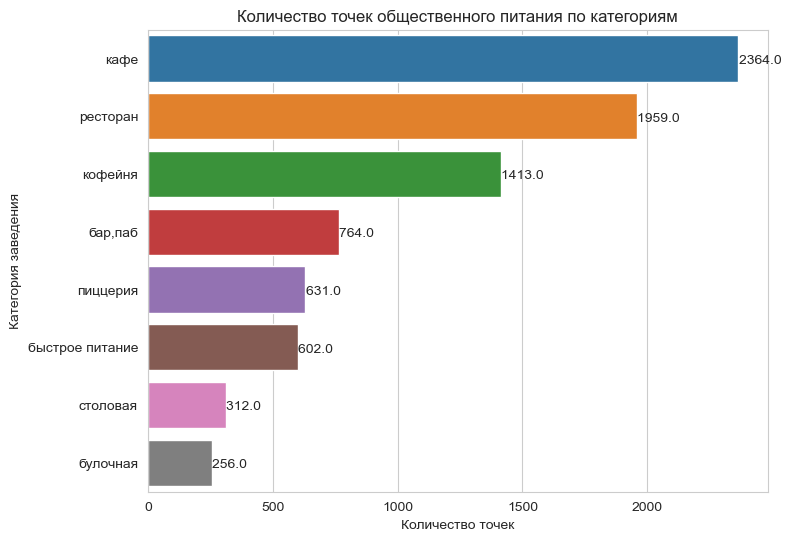

In [49]:
# создаем график
plt.figure(figsize = (8,6))
sns.set_style('whitegrid')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'obj_cnt', 
                 y = 'category',
                 data = objects_by_cat
                )

# оформляем график
plt.title('Количество точек общественного питания по категориям')
plt.xlabel('Количество точек')
plt.ylabel('Категория заведения')

# добавляем стикеры значений к столбцам
for p in ax.patches :
 _x = p. get_x () + p. get_width () + float(1.0)
 _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
 value = '{:.1f} '. format (p. get_width ())
 ax.text (_x, _y, value, ha= 'left')

# выводим результат
plt.show()

Визуализируем так-же доли точек в общей выборке по категориям круговой диаграммой.

In [50]:
# создаем круговую диаграмму
pie = go.Pie(labels = objects_by_cat['category'],
             values = objects_by_cat['obj_share']
            )

# оформляем круговую диаграмму
layout = go.Layout(template ='seaborn',
                   title = 'Доли категорий общественного питания по количеству точек')

# строим круговую диаграмму
fig = go.Figure(data = [pie], layout = layout)

# выводим результат
fig.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

- Больше всего заведений общественного питания в Москве относится к категории *кафе* - 2364 точки из 8301, что составляет 28.5%; 
- в тройку "лидеров" так-же входят *рестораны* - 1959 точек или 23.6% и *кофейни* с 1413 точками или 17.0%;          
- суммарно тройка лидеров составляет 69.1% от общего количества точек общественного питания в Москве;      
- категории, занимающие места с 4-го по 6-е - *бар,паб*(764 точки, 9.2%), *пиццерия*(631 точки, 7.6%) и *заведения быстрого питания*(602 точки, 7.3%) уступают лидерам в разы и суммарно составляют 24.1%;      
- явными аутсайдерами среди категорий являются *столовые* с 312 объектами (3.8%) и замыкающая таблицу  категория *булочная* с 256 точками т.е. 3.1% от общего количества.   
  

### Количество посадочных мест в  заведениях общественного питания по категориям <a id='step_3.2'></a>

Посмотрим как распределяется и как варьируется количество посадочных мест в заведениях различных категорий общественного питания Москвы.

Для этого вычислим и визуализируем соотношения медианных значений количества посадочных меcт (там где они указаны) по категориям, а так-же построим боксплот для всех категорий, чтобы понимать насколько сильно разнится количество посадочных мест внутри каждой категории.

In [51]:
# вычисляем медианное количество посадочных мест по категориям. Для этого:
# выделяем только те заведения, где указано количество мест, группируем по категориям,
# вычисляем медиану, отресетим индекс и сортируем по убыванию
seats_by_cat = data.query('seats.notna()') \
    .groupby('category') \
    .agg(seats_med =('seats', 'median')) \
    .reset_index() \
    .sort_values(by='seats_med', ascending=False)
    
# количество посадочных мест - целочисленный параметр, приведем к типу int    
seats_by_cat['seats_med'] = seats_by_cat['seats_med'].astype('int')  

# смотрим что получилось (для наглядности с градиентом)
seats_by_cat.style.background_gradient('Blues')    

,category,seats_med
6,ресторан,87
0,"бар,паб",81
4,кофейня,80
7,столовая,75
2,быстрое питание,65
3,кафе,60
5,пиццерия,55
1,булочная,50


Визуализируем привычной нам горизонтальной столбчатой диаграммой.

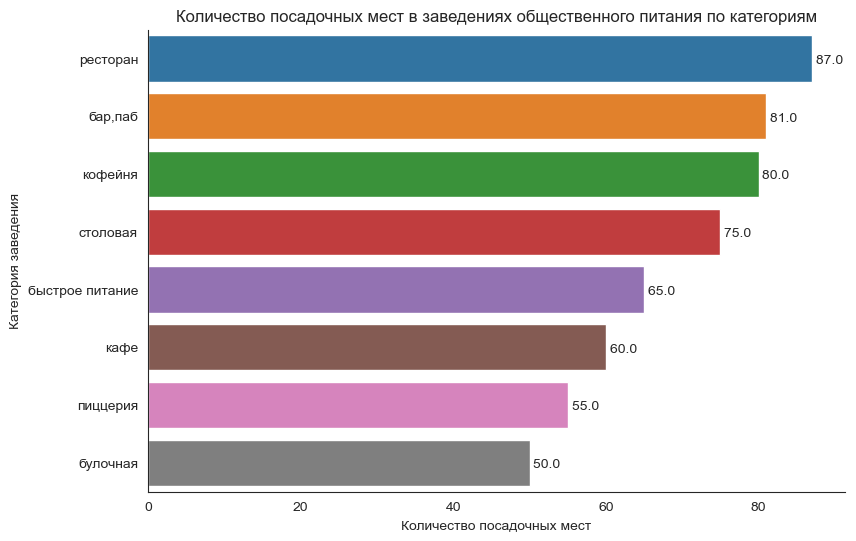

In [52]:
# создаем график
plt.figure(figsize = (9,6))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'seats_med', 
                 y = 'category', 
                 data = seats_by_cat
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Количество посадочных мест в заведениях общественного питания по категориям')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория заведения')

# добавляем стикеры значений к столбцам
for p in ax.patches : 
    _x = p. get_x () + p. get_width () + float(0.5)
    _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
    value = '{:.1f} '. format (p. get_width ())
    ax.text (_x, _y, value, ha= 'left')

# выводим результат
plt.show()

Чтобы понимать насколько сильно разнится количества посадочных мест внутри каждой категории построим теперь "ящики с усами" для всех категорий заведений общественного питания Москвы и посмотрим.

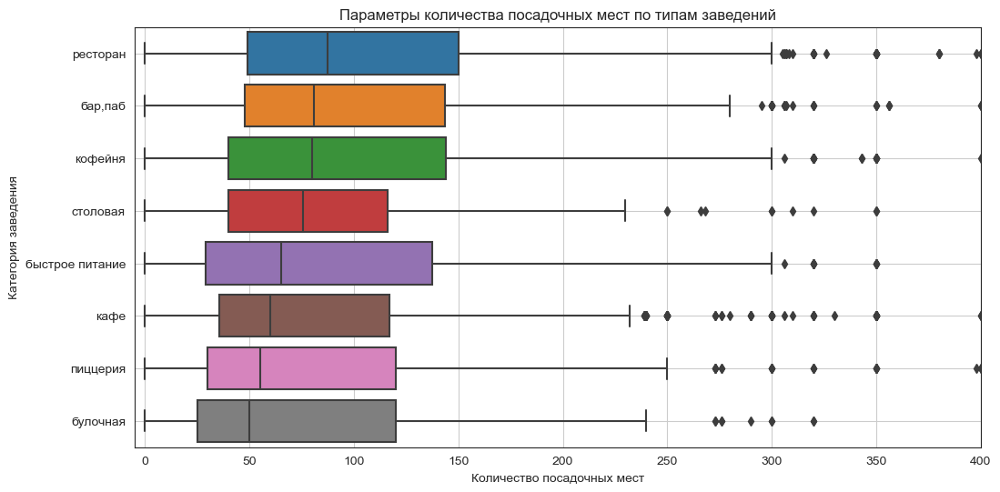

In [53]:
# создаем график
plt.figure(figsize=(12, 6))

# задаем порядок категорий так, как в предыдущем графике медиан количества мест
order = ['ресторан', 'бар,паб', 'кофейня', 'столовая', 'быстрое питание', 'кафе', 'пиццерия', 'булочная']

# строим боксплот
sns.boxplot(x='seats', y='category', data=data.query('seats.notna()'), order=order) 

# оформляем график
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория заведения')
plt.xlim(-5, 400)
plt.grid()
plt.title('Параметры количества посадочных мест по типам заведений')

# выводим результат
plt.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

- Лидером по количеству посадочных мест является категория *ресторан*, медианное значение количества мест в этой категории равно 87;
- За ресторанами довольно близко следуют категории *бар,паб* и *кофейня* с 81-м и 80-ю посадочными местами соответственно;
- Четвертым с примерно таким же отрывом в 5 мест удет категория *столовых* - у нее 75 мест в медиане;
- Отрыв пятого места - заведений *быстрого питания* составляет уже 10 мест и далее на ней с отставанием в 5 посадочных мест идут последовательно категории *кафе*, *пиццерия* и замыкающая рейтинг категория *булочная* (с 50 -ю местами)
    
Исходя из этого можно утверждать, что в большинстве своем заведения разных категорий общественного питания в Москве отличаются друг от друга не не сильно, располагая от 50 до 90 посадочными местами.
    
В то же время по диаграмме размаха видно, что например довольно заметное количество заведений в категориях *ресторан*, *бар,паб*, *кофейня* и *быстрое питание* имеют количество посадочных мест, близкое к 300-м. 
И это не предел: практически во всех категориях (за исключением *булочных*) есть "большие" заведения, вмещающие более 300 и даже 400 человек.           
Как мы отмечали ранее самым большим количеством задекларированных посадочных мест обладает ресторан РестоБар Argomento с 1200-ми посадочными местами в заведении. 
    
**Таким образом** можно сказать, что наиболее типичный формат заведения общественного питания для Москвы с точки зрения количества посадочных мест - это заведение с 50-100 посадочными местами.

### Соотношение сетевых и несетевых заведений общественного питания  <a id='step_3.3'></a>

Посмотрим как в наших данных распределены заведения в по признаку сетевое/несетевое. Посмотрим в общем и для каждой категории.    
Для этого посчитаем суммарное количество объектов с флагом принадлежности к сети и без него и поместим эти данные в небольшую отдельную табличку.

In [54]:
# сформируем маленький датафрей с суммарным количеством сетевых и несетевых заведений
chains_by_cat_tot = pd.DataFrame({'chain_flag': ['несетевые', 'сетевые'], \
                                  'obj_count': [data[data['chain'] == False]['name'].count(), \
                                                data[data['chain'] == True]['name'].count()]})

# смотрим что получилось
chains_by_cat_tot

,chain_flag,obj_count
0,несетевые,5171
1,сетевые,3130


Визуализируем соотношение сетевых и несетевых заведений круговой диаграммой.

In [55]:
# формируем данные для диаграммы
pie = go.Pie(labels=chains_by_cat_tot['chain_flag'],
             values=chains_by_cat_tot['obj_count'],
             pull = [0.02, 0])

# задаем параметры диаграммы
layout = go.Layout(template='seaborn', 
                   title = 'Соотношение сетевых и несетевых объектов общественного питания',
                   width=800, 
                   height=600,
                   annotations=[dict(x=1.20, 
                                     y=1.05,
                                     text='Принадлежность к сети',
                                     showarrow=False)])


# строим диаграмму
fig = go.Figure(data = [pie], layout = layout)

fig.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

По количеству точек обслуживания среди заведений общественного питания в Москве          
    преобладают несетевые заведения  в пропорции 62.3% несетевых  37.7% сетевых.

### Категории сетевых заведений общественного питания  <a id='step_3.4'></a>

На основе нашего основного датасета data построим визуализвцию такого распределения в виде горизонтальной столбчатой диаграммы для для всех категорий заведений общественного питания в разбивке на сетевые и несетевые.

In [56]:
# формируем данные для графика
chains_by_cat = data.groupby(['category', 'chain'])['name'].count()\
                    .reset_index().sort_values(by=['chain','name'], ascending=True)

# смотрим что получилось (для наглядности с градиентом)
chains_by_cat.style.background_gradient('Blues')

,category,chain,name
2,булочная,False,99
14,столовая,False,224
10,пиццерия,False,301
4,быстрое питание,False,370
0,"бар,паб",False,596
8,кофейня,False,692
12,ресторан,False,1303
6,кафе,False,1586
15,столовая,True,88
3,булочная,True,157


In [57]:
# создаем диаграмму 
fig = px.bar(chains_by_cat,
             x='name',
             y='category',
             text='name',
             template='plotly_white',                   
             color='chain',
             category_orders={"chain": ["сетевой", "несетевой"]}
            )

# оформляем график
fig.update_layout(title='Соотношение сетевых и несетевых заведений для разных категорий',
                   xaxis_title='Количество точек общественного питания',
                   yaxis_title='Категория заведения',
                 )

# выводим результат 
fig.show()

In [58]:
# формируем данные для графика
chains_by_cat_alt = data.pivot_table(index= 'category', columns= 'chain', values= 'name', aggfunc = 'count').reset_index()
chains_by_cat_alt.columns = ['category', 'chain', "nonchain"]

#chains_by_cat_alt['total'] = chains_by_cat_alt['chain'] + chains_by_cat_alt['nonchain']
chains_by_cat_alt['chain_share'] = 100 * chains_by_cat_alt['chain'] / \
                                    (chains_by_cat_alt['chain'] + chains_by_cat_alt['nonchain'])
#chains_by_cat_alt['share_nochain'] = 100 * chains_by_cat_alt['nochain'] / chains_by_cat_alt['total']
#chains_by_cat_alt['check'] = chains_by_cat_alt['share_yeschain'] + chains_by_cat_alt['share_nochain']

chains_by_cat_alt.sort_values('chain_share', ascending=False, inplace=True)

# смотрим что получилось (для наглядности с градиентом)
chains_by_cat_alt.style.background_gradient('Blues')

,category,chain,nonchain,chain_share
0,"бар,паб",596,168,78.010471
7,столовая,224,88,71.794872
3,кафе,1586,778,67.089679
6,ресторан,1303,656,66.513527
2,быстрое питание,370,232,61.461794
4,кофейня,692,721,48.973815
5,пиццерия,301,330,47.702060
1,булочная,99,157,38.671875


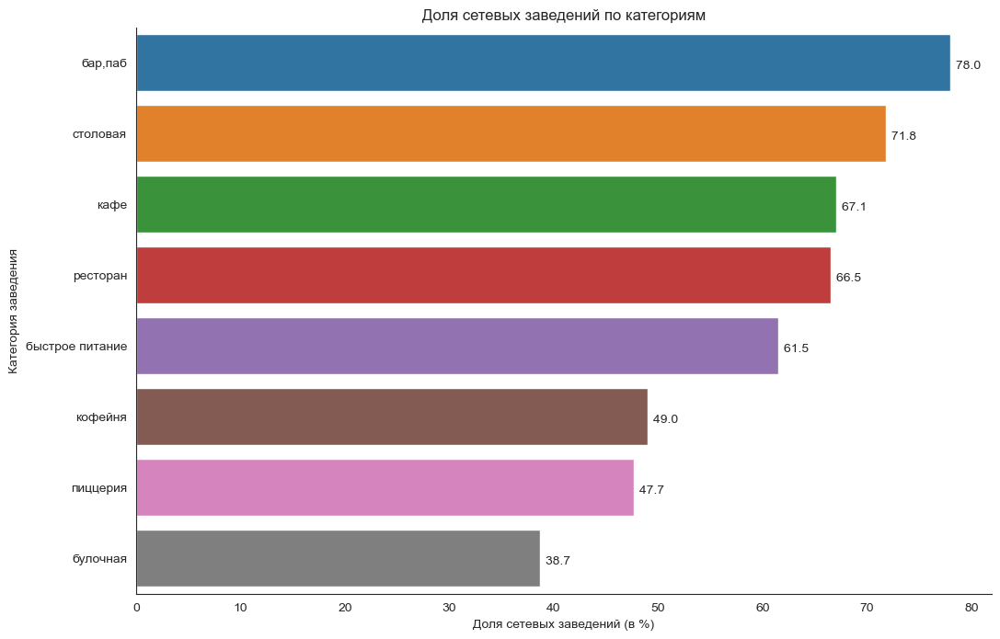

In [59]:
# создаем график
plt.figure(figsize = (12,8))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'chain_share', 
                 y = 'category', 
                 data = chains_by_cat_alt.sort_values('chain_share', ascending=False)
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Доля сетевых заведений по категориям')
plt.xlabel('Доля сетевых заведений (в %)')
plt.ylabel('Категория заведения')

# добавляем стикеры значений к столбцам
for p in ax.patches : 
    _x = p. get_x () + p. get_width () + float(0.52)
    _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
    value = '{:.1f} '. format (p. get_width ())
    ax.text (_x, _y, value, ha= 'left')

# выводим результат
plt.show()

Для наглядности посмотрим как распределены по категориям только сетевые заведения.

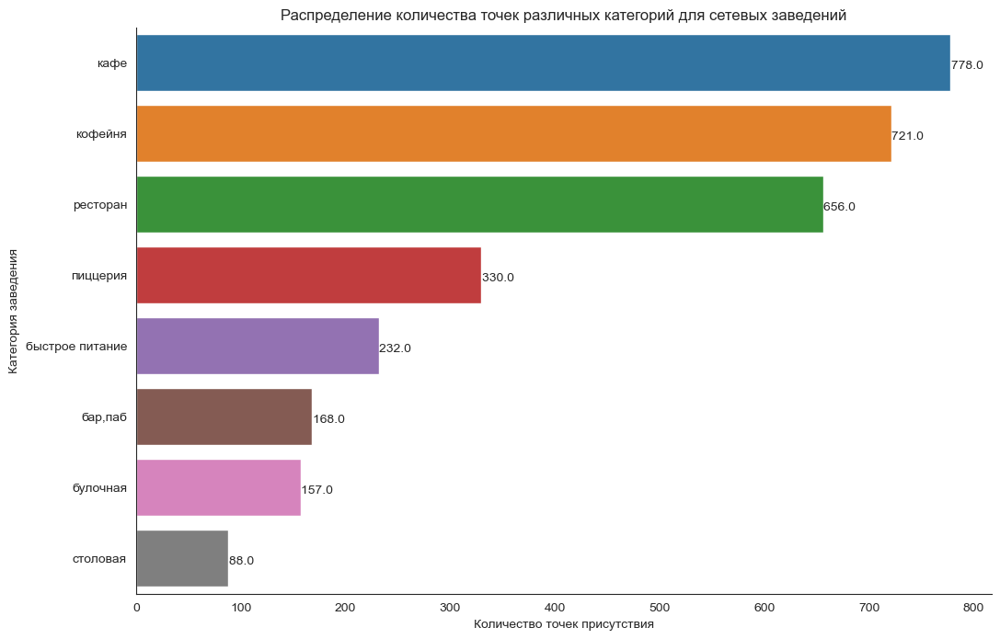

In [60]:
# создаем график
plt.figure(figsize = (12,8))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'name', 
                 y = 'category', 
                 data = chains_by_cat[chains_by_cat['chain'] == True].sort_values('name', ascending=False)
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Распределение количества точек различных категорий для сетевых заведений')
plt.xlabel('Количество точек присутствия')
plt.ylabel('Категория заведения')

# добавляем стикеры значений к столбцам
for p in ax.patches : 
    _x = p. get_x () + p. get_width () + float(0.52)
    _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
    value = '{:.1f} '. format (p. get_width ())
    ax.text (_x, _y, value, ha= 'left')

# выводим результат
plt.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

При общем соотношении количества точек обслуживания среди заведений общественного питания в Москве  5131 несетевых (62.3%) к 3130 сетевым (37.7%) мы видим по графику, что в различных категориях заведений картина несколько отличается:              
- в самых многочисленных категориях - *кафе* и *ресторанах* картина полностью соответствует общей: доля сетевых заведений в этих категориях порядка 35-40%;
- как ни странно - такую же долю сетевых заведений можно наблюдать и в категории*быстрое питание*, хотя интуитивно казалось, что доля "сетевиков" здесь должна быть гораздо выше;
- в категориях *бар,паб* и *столовая* картина еще более выражена: здесь долю несетевых заведений можно назвать доминирующей - около 80%;
- в так-же относительно массовых категориях *кофейня* и *пиццерия* картина отклоняется в другую сторону: доля сетевых заведений в этих категориях уже превышает долю несетевых примерно от 0 до 5%;
- наиболее ярко эта тенденция выражена в наименее распространенной категории *булочных* здесь доля сетевых заведений составляет уже порядка 60%.   

###  Наиболее популярные сети общественного питания в Москве (топ-15)  <a id='step_3.5'></a>

Выделим из нашего датасента данные о сетевых заведениях, возьмем из них 15 крупнейших.

In [61]:
# выделяем сетевые заведения, сортируем по количеству точек присетствия и берем первые 15
top_chains_by_cat = data[data['chain'] == True].groupby('name').agg({'category':'first', 'chain': 'count'}) \
                                               .sort_values(by='chain', ascending=False).reset_index().head(15)

# смотрим что получилось (для наглядности с градиентом)
top_chains_by_cat.style.background_gradient('Blues')

,name,category,chain
0,шоколадница,кофейня,120
1,доминос пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,cofix,кофейня,65
5,prime,ресторан,50
6,хинкальная,быстрое питание,44
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,38


In [62]:
# считаем сколько всего точек у заведений из топ-15
top_chains_total = top_chains_by_cat['chain'].sum()

# выводим результат
print( "В Москве всего", top_chains_total, "заведений из топ-15 крупнейших сетей" )

В Москве всего 771 заведений из топ-15 крупнейших сетей


Визуализируем соотношение этих топ-15 сетей привычной нам горизонтальной столбчатой диаграммой.

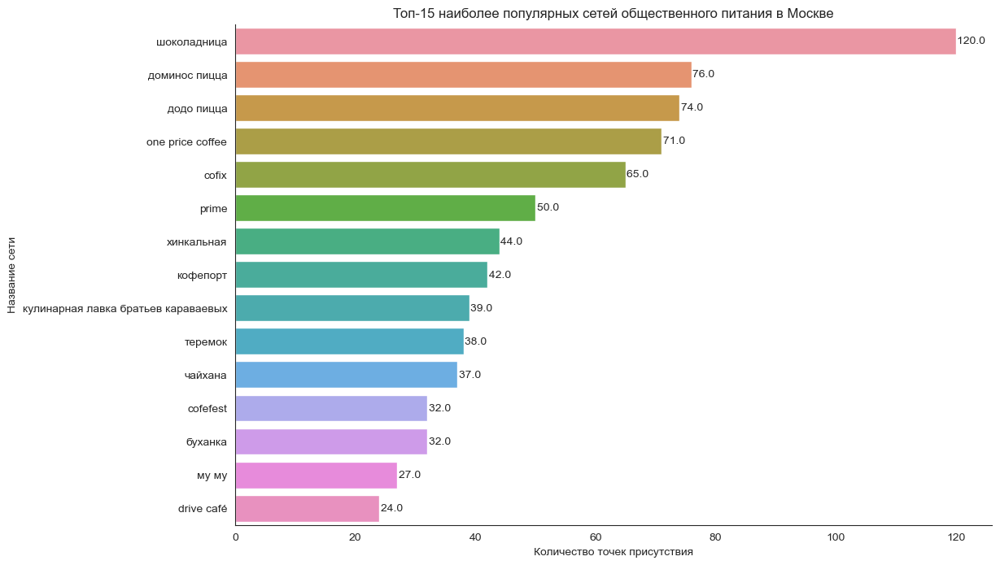

In [63]:
# создаем график
plt.figure(figsize = (12,8))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'chain', 
                 y = 'name', 
                 data = top_chains_by_cat
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Топ-15 наиболее популярных сетей общественного питания в Москве')
plt.xlabel('Количество точек присутствия')
plt.ylabel('Название сети')

# добавляем стикеры значений к столбцам
for p in ax.patches : 
    _x = p. get_x () + p. get_width () + float(0.2)
    _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
    value = '{:.1f} '. format (p. get_width ())
    ax.text (_x, _y, value, ha= 'left')

# выводим результат
plt.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

Всего заведения из топ-15 наиболее популярных сетевых заведений общественного питания в Москве включают в себя 771 точку обслуживания.               
Среди заведений топ-15 преобладают *кофейни* и *кафе*: из 5 и 4 из 15 соответственно.  
Остальные категории представлены в топ-15 одним  (как точки *быстрого питания* и *булочные*) или двумя (как *пиццерии* и *рестораны*) заведением.            
Фактически в топ-15 нет ни одного классического ресторана, поскольку "Prime" и "Теремок", которые значатся в этом списке как рестораны, представляют собой скорее небольшие "бутербродные", специализирующиеся на "обеденном перекусе" и ресторанами их можно назвать лишь условно.                  
Так-же обращает внимание отсутствие в списке "бросающихся в глаза" в Москве ресторанов быстрого питания, таких как "Ростикс", "Вкусно и точка", "Бургер-кинг". Это удивительно, поскольку интуитивно видится, что у каждой из этих сетей точек присутствия в Москве должно быть больше, чем 24 (это последний член топ-15). Вместо этого категория *быстрого питания* в списке представлена непонятным заведением с общим названием "Хинкальная", из которого непонятно, действиетльно ли это одна сеть или просто случайный набор заведений с одинаковым смысловым обозначением.

    
Явным лидером поименного рейтинга является кофейня "Шоколадница", за которой следуют две наиболее популярных пиццерии "Домино-с" и "Додо", а за ними вновь идут две популярных сети кофеен - "one price coffee" и "cofix".                  
Замыкает рейтинг топ-15 довольно специфическая сеть кафе - "drive café", базирующаяся на сети автозаправок ГазПромНефти. 

###  Соотношение средних рейтингов разных категорий заведений  <a id='step_3.6'></a>

Сгруппируем данные в нашем основном датафрейме data по категориям заведений и вычислим средний рейтинг по категориям на основании столбца "rating".

In [64]:
# группируем данные по категориям и считаем средний рейтинг
rating_by_cat = data.groupby('category').agg({'rating' : 'mean'}).sort_values('rating', ascending = False).reset_index()

# смотрим что получилось (с градиентом)
rating_by_cat.style.background_gradient('Blues')

,category,rating
0,"бар,паб",4.387696
1,ресторан,4.307810
2,пиццерия,4.301109
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.213462
6,кафе,4.124873
7,быстрое питание,4.049003


Визуализируем полученное распределение средних рейтингов по категориям заведений привычной нам горизонтальной столбчатой диаграммой.

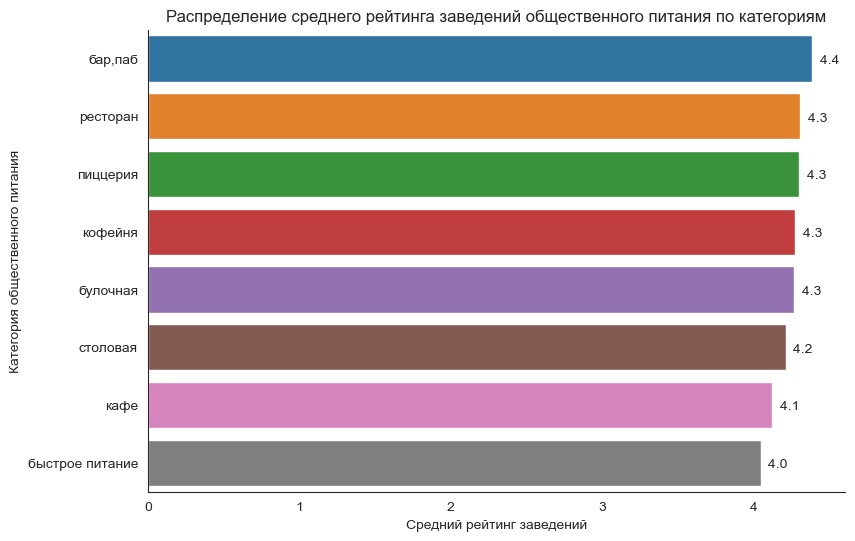

In [65]:
# создаем график
plt.figure(figsize = (9,6))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'rating', 
                 y = 'category', 
                 data = rating_by_cat
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Распределение среднего рейтинга заведений общественного питания по категориям')
plt.xlabel('Средний рейтинг заведений')
plt.ylabel('Категория общественного питания')

# добавляем стикеры значений к столбцам
for p in ax.patches : 
    _x = p. get_x () + p. get_width () + float(0.05)
    _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
    value = '{:.1f} '. format (p. get_width ())
    ax.text (_x, _y, value, ha= 'left')

# выводим результат
plt.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

- Распределение довольно ровное: средние рейтинги колеблются по категориям от 4.0 до 4.4;
- Самые высокие показатели рейтинга у *баров и пабов* (4.4);
- рейтинг буквально чуть ниже - 4.3 имеют сразу 4 категории заведений: *рестораны*, *пиццерии*, *кофейни* и *булочные*;
- еще чуть ниже имеют рейтинги категории *столовая* и *кафе* (4.2 и 4.1 соответственно);
- замыкает рейтинг категория *быстрое питание* (4.0), которая например в топ-15 представлена  сетью хинкальных и по всей видимости минимальный рейтинг этой категории связан с излишней для Москвы "демократичностью" такого рода заведений как по качеству еды, так и по качеству обслуживания. 

### Распределение объектов общественного питания по округам Москвы: общее и по категориям   <a id='step_3.7'></a>

Перейдем плавно к пространсвенному распределению объектов общественного питания по административным районам Москвы.

Ранее мы отмечали, что у нас в исследовании присутствуют 9 округов Москвы, за исключением Зеленограда и Новой Москвы.    
А именно:

In [66]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Посмотрим как распределены объекты общественного питания по округам Москвы.

**Сначала агрегированно**.

In [67]:
# группируем данные по округам, считаем количество точек
objects_by_dist = data.groupby('district').agg(obj_cnt = ('name', 'count')).sort_values('obj_cnt', ascending=False).reset_index()

# создадим столбец с долей (%) каждой категории
objects_by_dist['obj_share'] = round( 100 * objects_by_dist['obj_cnt'] / objects_by_dist['obj_cnt'].sum() , 1)

# смотрим что получилось (для наглядности делаем градиент)
objects_by_dist.style.background_gradient('Blues')

,district,obj_cnt,obj_share
0,Центральный административный округ,2234,26.900000
1,Северный административный округ,892,10.700000
2,Северо-Восточный административный округ,880,10.600000
3,Южный административный округ,877,10.600000
4,Западный административный округ,838,10.100000
5,Восточный административный округ,780,9.400000
6,Юго-Восточный административный округ,705,8.500000
7,Юго-Западный административный округ,694,8.400000
8,Северо-Западный административный округ,401,4.800000


Визуализируем количество точек по округам Москвы горизонтальной столбчатой диаграммой.

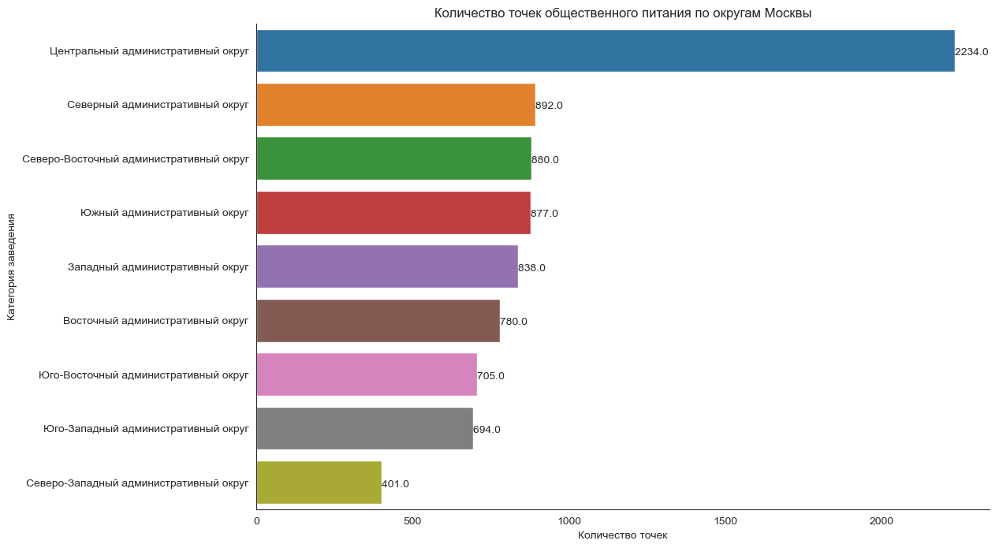

In [68]:
# создаем график
plt.figure(figsize = (12,8))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'obj_cnt', 
                 y = 'district',
                 data = objects_by_dist
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Количество точек общественного питания по округам Москвы')
plt.xlabel('Количество точек')
plt.ylabel('Категория заведения')

# добавляем стикеры значений к столбцам
for p in ax.patches :
 _x = p. get_x () + p. get_width () + float(0.2)
 _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
 value = '{:.1f} '. format (p. get_width ())
 ax.text (_x, _y, value, ha= 'left')


# выводим результат
plt.show()

Визуализируем так-же доли точек в общей выборке по категориям круговой диаграммой.

In [69]:
pie = go.Pie(labels= objects_by_dist['district'],
             values= objects_by_dist['obj_share']
            )

layout = go.Layout(template='seaborn',
                   title = 'Доли округов Москвы по количеству заведений общественного питания')
fig = go.Figure(data = [pie], layout = layout)
fig.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

- В распределении заведений общественного питания по округам в Москве очевидно доминирует *Центральный округ* с 2234 заведениями, что составляет 26.9% от всего количества точек общественного питания в Москве; 
- уступая лидеру в 2.5 раза 4 округа имеют на своей територии примерно по 850 объектов общественного питания. Это следующие округа:
    - *Северный округ* с 892 объектами или 10.7%,
    - *Северо-восточный округ* - 880 объектов или 10.6%,
    - *Южный округ* - 877 объектов или 10.6%,
    - *Западный округ* - 838 объектов или 10.1%;           
- у следующих 3-х округов идет снижение количества объектов на территории округов с 800 до менее 700:         
    - *Восточный округ* - 780 объектов или 9.4%, 
    - *Юго-восточный округ* - 705 объектов или 8.5%, 
    - *Юго-западный округ* - 694 объектов или 8.4%;     
- явным аутсайдером выглядит *Северо-западный округ*, имея на своей территории только 401 заведение, что составляет 4.8% от всего количества объектов общественного питания в Москве.  

Посмотрим есть ли специфика в распределении объектов общественного питания по округам Москвы              
**в зависимости от категории заведения**.

Построим распределение сразу для всех округов и категорий.

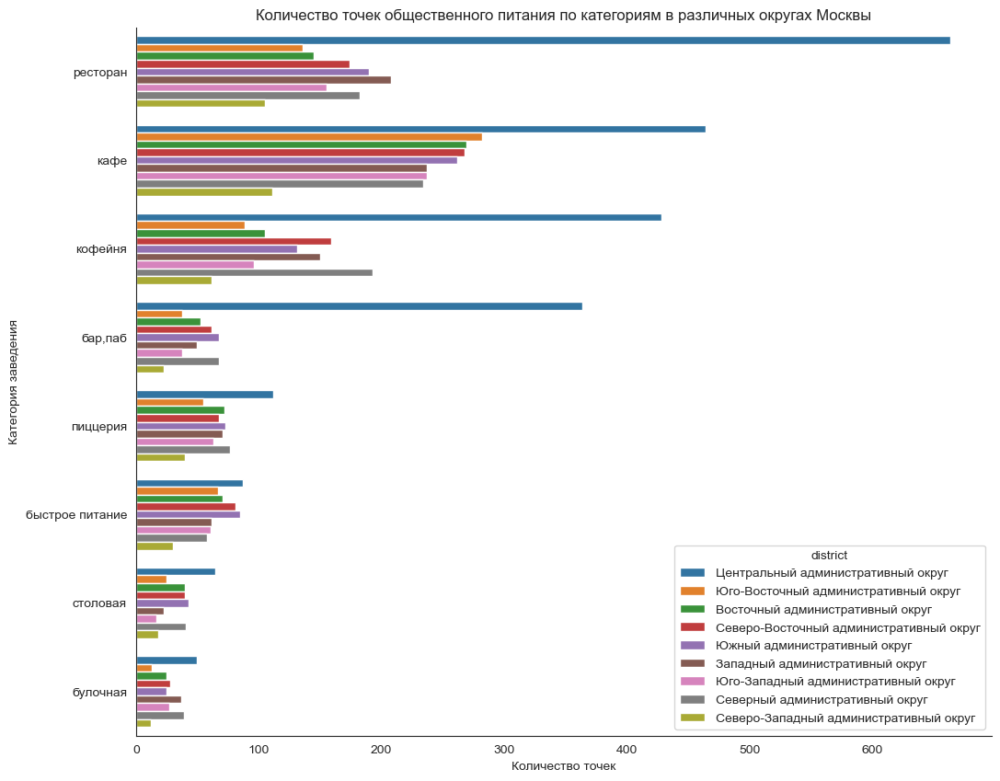

In [70]:
# группируем данные по категориям и округам, считаем количество точек
objects_by_cat_dist = data.groupby(['category', 'district']) \
.agg(obj_cnt = ('name', 'count')).sort_values('obj_cnt', ascending=False).reset_index()

# создаем график
plt.figure(figsize = (12,10))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
sns.barplot(x = 'obj_cnt', 
            y = 'category',
            hue = 'district',
            data = objects_by_cat_dist
           )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Количество точек общественного питания по категориям в различных округах Москвы')
plt.xlabel('Количество точек')
plt.ylabel('Категория заведения')

# выводим результат
plt.show()

Таперь возьмем немного другой разрез.

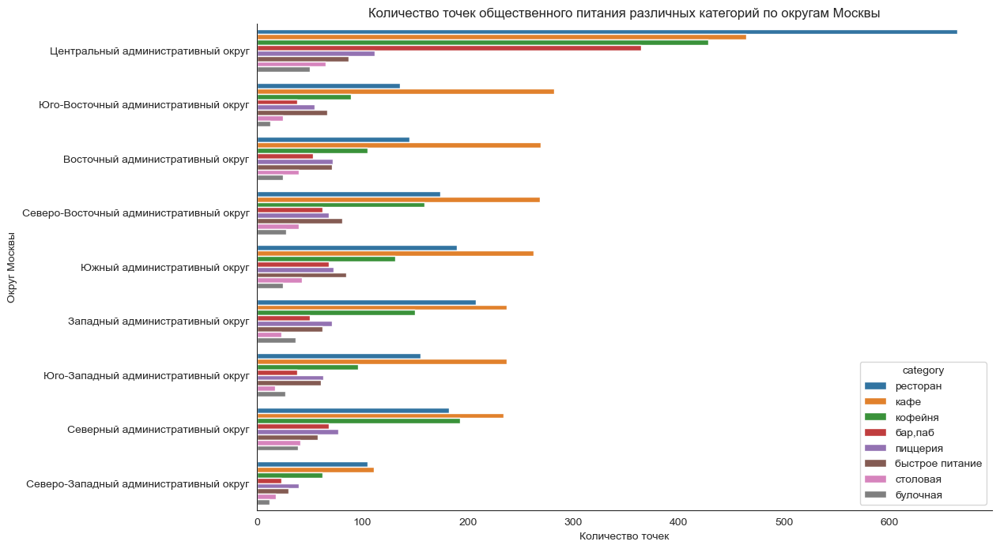

In [71]:
# группируем данные по округам и категориям, считаем количество точек
objects_by_cat_dist = data.groupby(['district', 'category']) \
.agg(obj_cnt = ('name', 'count')).sort_values('obj_cnt', ascending=False).reset_index()

# создаем график
plt.figure(figsize = (12,8))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
sns.barplot(x = 'obj_cnt', 
            y = 'district',
            hue = 'category',
            data = objects_by_cat_dist
           )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Количество точек общественного питания различных категорий по округам Москвы')
plt.xlabel('Количество точек')
plt.ylabel('Округ Москвы')

# выводим результат
plt.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

- Доминирование *Центрального округа* по количеству объектов общественного питания над другими округами Москвы особенно ярко проявляется в категориях ресторанов, кофеен и баров/пабов. В этих категориях преследователи отстают в разы. А именно:    
    - в категории *кофейня* разрыв с ближайшим преследователем - Северным округом составляет 2 с лишним раза,
    - в категории *ресторан* разрыв с преследователем - Западным округом составляет 3с лишним раза,
    - а в категории *бар,паб* разрыв с идущим на втором месте Южным округом составляет около 5 с половиной раз;
   
- Довольно существенное превосходство *Центрального округа* над остальными округами наблюдавется и в категориях кафе и пицерий. В этих категориях отрыв уже не в разы, но на десятки процентов:           
    - в категории *кафе* отрыв от ближайшего преследователя - Юго-восточного округа составляет около 60-65%, 
    - в категории *пиццерия* отрыв от Юго-восточного округа - примерно 40 45%;

- В остальных категориях преимущество *Центрального округа* вполне заметно, но не является же столь явным.  
    
При этом картина распределения заведений по категориям в *Центральном округе* выглядит несколько иначе, нежели в других округах Москвы: здесь заметно лидирует категория *ресторанов* (с опережением около 35-40%), в то время как в остальных округах лидером является категория *кафе* (опережающая остальные категории примерно в той же пропорции). 

Посмотрим теперь есть ли отличия в распределении объектов общественного питания по округам Москвы              
**в зависимости от принадлежности заведения к сети**.

In [72]:
# формируем данные для графика
chains_by_dist = data.groupby(['district', 'chain'])['name'].count().reset_index() \
                    .sort_values(by=['chain','name'], ascending=True)

# смотрим что получилось (c градиентом)
chains_by_dist.style.background_gradient('Blues')

,district,chain,name
8,Северо-Западный административный округ,False,248
14,Юго-Западный административный округ,False,404
2,Западный административный округ,False,471
12,Юго-Восточный административный округ,False,493
0,Восточный административный округ,False,509
4,Северный административный округ,False,550
6,Северо-Восточный административный округ,False,554
16,Южный административный округ,False,578
10,Центральный административный округ,False,1364
9,Северо-Западный административный округ,True,153


In [73]:
# создаем диаграмму 
fig = px.bar(chains_by_dist,
             x='name',
             y='district',
             text='name',
             template='plotly_white',                   
             color='chain',
             category_orders={"chain": ["сетевой", "несетевой"]}
            )

# оформляем график
fig.update_layout(title='Соотношение сетевых и несетевых заведений по округам Москвы',
                  xaxis_title='Количество точек общественного питания',
                  yaxis_title='Округ Москвы',
                 )

# выводим результат 
fig.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

Соотношение сетевых и несетевых заведений распределено по округам Москвы довольно равномерно
- Максимальная доля сетевых заведений в *Центральном* и *Западном* округах - около 40%;
- Минимальная доля сетевых заведений в *Южном* и *Юго-восточном* округах - около 35%;
- Остальные округа варьируется примерно от 35% до 40%.
    
По околичеству заведений *Центральный* округ доминирует как среди сетевых, так и среди несетевых заведений.        
Минимальное количество опять же как сетевых так и несетевых заведений в *Северо-западном* округе.    

Посмотрим теперь как распределены по округам Москвы заведения из **топ-15 крупнейших сетей**.

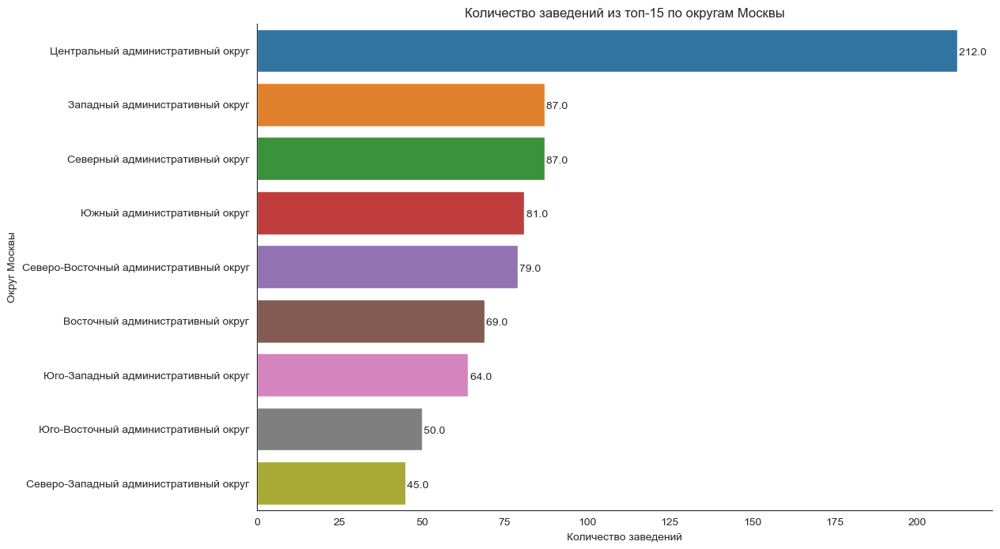

In [74]:
# группируем данные по округам, считаем количество точек заведений из топ-15
top_chains_by_dist_agr = data[data['name'].isin(top_chains_by_cat['name'])].groupby('district').agg({'chain': 'count'}). \
sort_values(by='chain', ascending=False).reset_index()

# создаем график
plt.figure(figsize = (12,8))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'chain', 
                 y = 'district',
                 data = top_chains_by_dist_agr
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Количество заведений из топ-15 по округам Москвы')
plt.xlabel('Количество заведений')
plt.ylabel('Округ Москвы')

# добавляем стикеры значений к столбцам
for p in ax.patches :
 _x = p. get_x () + p. get_width () + float(0.5)
 _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
 value = '{:.1f} '. format (p. get_width ())
 ax.text (_x, _y, value, ha= 'left')


# выводим результат
plt.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

Картина распределения заведений из топ-15 практически один в один повторяет общую картину распределения всех заведений общественного питания по округам: *Центральный округ* доминирует, остальные существенно уступают, замыкает рейтинг *Северо-западный округ*, уступая лидеру в 5 раз. 

Посмотрим может быть есть какая-то специфика у каких-нибудь **конкретных сетей** из тех же топ-15 крупнейших сетей.

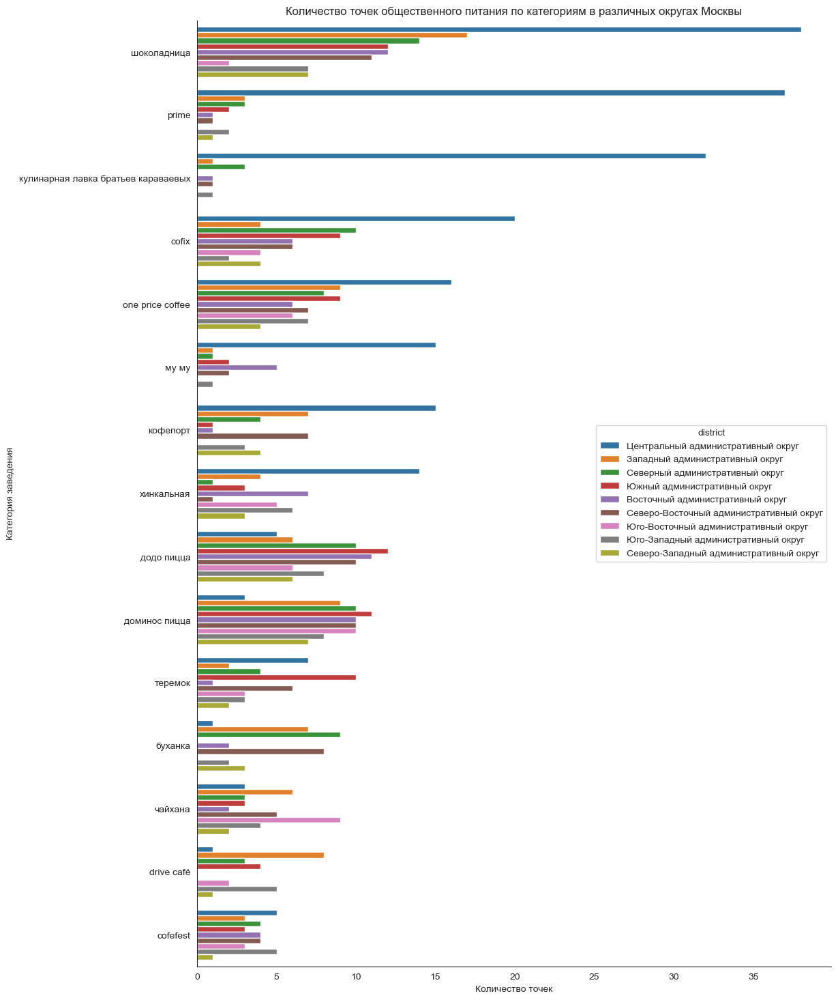

In [75]:
# группируем данные по заведениям топ-15 и округам, считаем количество точек
top_chains_by_dist = data[data['name'].isin(top_chains_by_cat['name'])].groupby(['name', 'district']) \
.agg(obj_cnt = ('chain', 'count')).sort_values('obj_cnt', ascending=False).reset_index()

# создаем график
plt.figure(figsize = (12,18))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
sns.barplot(x = 'obj_cnt', 
            y = 'name',
            hue = 'district',
            data = top_chains_by_dist
           )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Количество точек общественного питания по категориям в различных округах Москвы')
plt.xlabel('Количество точек')
plt.ylabel('Категория заведения')

# выводим результат
plt.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

В таком разрезе видна специфика распределения точек конкретных сетей по округам Москвы.             
- У крупнейшей сети - *Шоколадницы* картина похожа на общее распределение объектов общественного питания с отрывом Центрального окруда вдвое от остальных и затем постепенное снижение количества точек по остальным округам. Единственное отличие, которое бросается в глаза - это очень малое количество точек в Юго-западном округе (в общем рейтинге явным аутсайдером был Северо-западный округ). Примерно такую же картину демонстрирует *one price coffee* (но уже без "провала" в Юго-западщном округе;
- У сети ресторанов *Prime* (которые как мы отмечали ранее не очень то и рестораны) и у *кулинарной лавки братьев караваевых* практически все точки (а их как мы смотрели выше 50 и 39 соответственно) сосредоточены в Центральном округе. Несколько менее выраженная, но аналогичная картина и у кафе *Му-му*, у кофейни *Кофепорт* и у сети быстрого питания *Хинкальная*;
- У сетей пиццерий *Доминос пицца* и *Додо пицца* картина обратная - сети довольно хорошо представлены по всем округам Москвы и Центральный округ у них скорее в аутсайдерах, нежели в лидерах. Аналогичная картина практически во всех остальных заведениях из топ-15;
- Есть смысл наверное так-же отметить, что в топ-15 есть заведения: сеть булочных *Буханка* и сеть авто-кафе *Drive café*, которые представлены не во всех округах Москвы ( в 7 и 6 из 9 соответственно).

### Фоновая картограмма (хороплет) со средним рейтингом заведений по округам Москвы  <a id='step_3.8'></a>

Прежде чем продолжить сделаем одно вспомогательное упражнение:       
поскольку мы изменяли текстовые названия в нашем основном датафрейме data, то названия округов Москвы у нас вполне вероятно могут не совпасть с аналогичными названиями в json файле карты. Поэтому введем вспомогательный столбец с id округов Москвы, так как они фигурируют в картах. 

In [83]:
# создаем столбец
data['district_id'] = 0

# задаем значения id для каждого округа
data.loc[data['district'] == "Центральный административный округ", 'district_id'] = 2162196
data.loc[data['district'] == "Северный административный округ", 'district_id'] = 162903
data.loc[data['district'] == "Северо-Западный административный округ", 'district_id'] = 446092
data.loc[data['district'] == "Западный административный округ", 'district_id'] = 226149
data.loc[data['district'] == "Южный административный округ", 'district_id'] = 1282181
data.loc[data['district'] == "Восточный административный округ", 'district_id'] = 1320234
data.loc[data['district'] == "Юго-Западный административный округ", 'district_id'] = 1304596
data.loc[data['district'] == "Северо-Восточный административный округ", 'district_id'] = 1252558
data.loc[data['district'] == "Юго-Восточный административный округ", 'district_id'] = 1278703

# смотрим что получилось
data.sample()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,district_id
5248,foodband ru,кафе,"москва, большая татарская улица, 21, стр. 4",Центральный административный округ,"ежедневно, круглосуточно",55.739634,37.634161,3.9,NaN,NaN,NaN,NaN,True,15,большая татарская улица,True,2162196


Теперь перйдем к работе с рейтингами заведений.

Сформируем небольшой датафрейм со средними рейтингами заведений общественного питания по округам Москвы. 

In [84]:
# группируем данные по округам и берем средний рейтинг
ratings_by_dist = data.groupby('district', as_index=False).agg({'district_id': 'first','rating': 'mean'}).round(2).sort_values('rating',ascending=False)

# смотрим что получилось (c градиентом)
ratings_by_dist[['district', 'rating']].style.background_gradient('Blues')

,district,rating
5,Центральный административный округ,4.380000
2,Северный административный округ,4.240000
4,Северо-Западный административный округ,4.210000
1,Западный административный округ,4.190000
8,Южный административный округ,4.190000
0,Восточный административный округ,4.180000
7,Юго-Западный административный округ,4.180000
3,Северо-Восточный административный округ,4.150000
6,Юго-Восточный административный округ,4.110000


Теперь возьмем границы округов Москвы из файла "admin_level_geomap.geojson"... 

In [87]:
# загружаем JSON-файл с границами округов Москвы
try:
    state_geo = 'admin_level_geomap.geojson'
    
except:
    state_geo = '/datasets/admin_level_geomap.geojson'


# Задаем координаты центра Москвы 
moscow_lat = 55.751244
moscow_lng = 37.618423


Построим фоновую картограмму (хороплет) со средним рейтингом заведений для каждого округа.          
Границы округов Москвы возьмем из данного заказчиком в задании к проекту файла "admin_level_geomap.geojson"

In [88]:
# создаём карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=ratings_by_dist,
    columns=['district_id', 'rating'],
    key_on='feature.id',
    fill_color='Blues',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по округам Москвы',
).add_to(m1)

# выводим карту
m1

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

- Наивысший рейтинг среди округов Москвы имеет *Центральный округ* - 4.38,
- Вторым следует *Северный округ* с рейтингом 4.24,
- Нименьший рейтинг у *Юго-восточного округа*  - 4.11,
- *Остальные округа* располагаются между ними и имеют рейтинги 4.15 - 4.20.    

### Распределение всех заведений общественного питания на карте Москвы по кластерам <a id='step_3.9'></a>

Отобразим все заведения на карте Москвы с помощью кластеров средствами библиотеки folium. 

In [89]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m2)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m2

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

- Наиболее плотное сосредоточение заведений общественного питания находится в *Центральном округе*, что неудивительно, учитывая структуру людских потоков в Москве (включая туристические потоки). 
- По остальным округам плотность заведений в три-четыре раза меньше.

### Топ-15 улиц Москвы по количеству заведений общественного питания <a id='step_3.10'></a>

На основе созданного нами ранее столбца с названиями улиц выделим топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. 

In [90]:
# формируем список с улицами и количеством заведений на каждой улице
streets_tot = data['street'].value_counts().reset_index()

# для удобства именуем столбцы
streets_tot.columns = ['street_name', 'obj_cnt']

# выдкляем топ-15 улиц по количеству заведений на улице
top15_streets_tot = streets_tot.head(15)

# смотрим что получилось (c градиентом)
top15_streets_tot.style.background_gradient('Blues')

,street_name,obj_cnt
0,проспект мира,183
1,профсоюзная улица,121
2,проспект вернадского,106
3,ленинский проспект,106
4,ленинградский проспект,95
5,дмитровское шоссе,86
6,каширское шоссе,77
7,варшавское шоссе,73
8,ленинградское шоссе,70
9,мкад,65


Визуализируем количество точек на топ-15 улицах горизонтальной столбчатой диаграммой.

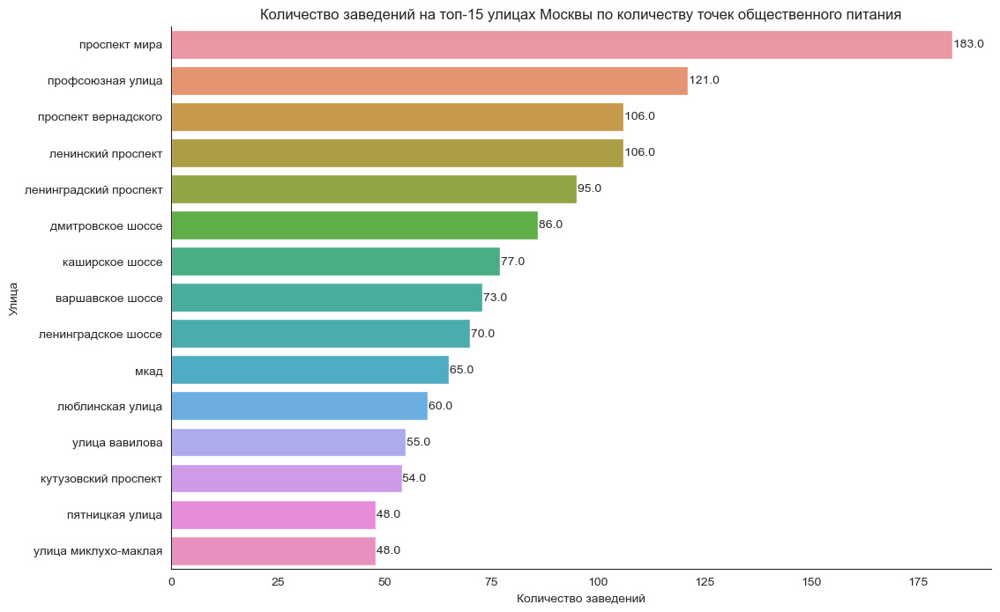

In [91]:
# создаем график
plt.figure(figsize = (12,8))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'obj_cnt', 
                 y = 'street_name',
                 data = top15_streets_tot
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Количество заведений на топ-15 улицах Москвы по количеству точек общественного питания')
plt.xlabel('Количество заведений')
plt.ylabel('Улица')

# добавляем стикеры значений к столбцам
for p in ax.patches :
 _x = p. get_x () + p. get_width () + float(0.2)
 _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
 value = '{:.1f} '. format (p. get_width ())
 ax.text (_x, _y, value, ha= 'left')


# выводим результат
plt.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

- В рейтинге самых "насыщенных" заведениями общественного питания в Москве уверенно ( с запасом в полтора раза) лидирует *Проспект Мира*. Вполне возможно, что на результат вляиет ее протяженность и туристическая насыщенность (например ВДНХ).
- Ближайшим преследователем лидера является *Профсоюзная улица* с 121- заведением. Однако, если объединить *Ленинградский проспект*, у которого 95 заведений с его естестсенным продолжением - *Ленинградским шоссе*, на котором расположено 70 заведений, то эта  "объединенная Ленинградка" уверенно займет второе место, очень близко приблизившись к лидеру ( там будет 165 заведений).
- Кроме двух лидеров больше сотни точек общественного питания расположены так-же на *проспекте Вернадского* и *Ленинском проспекте*.
- Так-же в топ-15 входят большитнство "вылетных магистралей" Москвы: *Дмитровское, Каширское, Варшавское, Ленинградское шоссе* и *Кутузовский проспект*. 
- Кроме них в топ-15 входит *МКАД*. Думается - в основном за счет её общей протяженности, обилия кафе на заправках    и наличие торговых молов.
- На удивление среди топ-15 нет ни одной чентральной улицы Москвы (самая близкая к центра - *Пятрницкая улица*, что по всей видимостиобъясняется их относительно небольшой протяженностью: даже при высокой плотности на них "не помещается" столь много заведений.
- Замыкает рейтинг *улица Миклухо-Маклая* с 48-ю заведениями общественного питания, расположенными на ней.

Разобьем общее количество заведений по категориям.                          
Выделим из всех улиц только топ-15 и получим количество заведений по категориям на этих улицах. 

In [92]:
#создадим таблицу с названиями улиц и категорий
streets_by_cat_dist = data.groupby(['street', 'category', 'district'])['name'].count().reset_index().sort_values('name', ascending=False)

# именуем столбцы поудобнее
streets_by_cat_dist.columns = ['street_name', 'category', 'district', 'obj_cnt']

# выделяем таблицу с названиями топ-15 улиц и категорий
top_15_streets_by_cat = streets_by_cat_dist[streets_by_cat_dist['street_name'].isin(top15_streets_tot['street_name'])] \
                        [['street_name', 'category', 'obj_cnt']] \
                        .sort_values(['obj_cnt'], ascending=False)

# смотрим что получилось
top_15_streets_by_cat

,street_name,category,obj_cnt
2199,проспект мира,кафе,41
2215,профсоюзная улица,кафе,35
2205,проспект мира,ресторан,34
2182,проспект вернадского,ресторан,27
1325,ленинградское шоссе,ресторан,26
...,...,...,...
2185,проспект вернадского,столовая,1
895,дмитровское шоссе,"бар,паб",1
2861,улица вавилова,булочная,1
2860,улица вавилова,булочная,1


Визуализируем количество точек в разбивке по категориям для каждой из улиц топ-15 так-же горизонтальной столбчатой диаграммой.

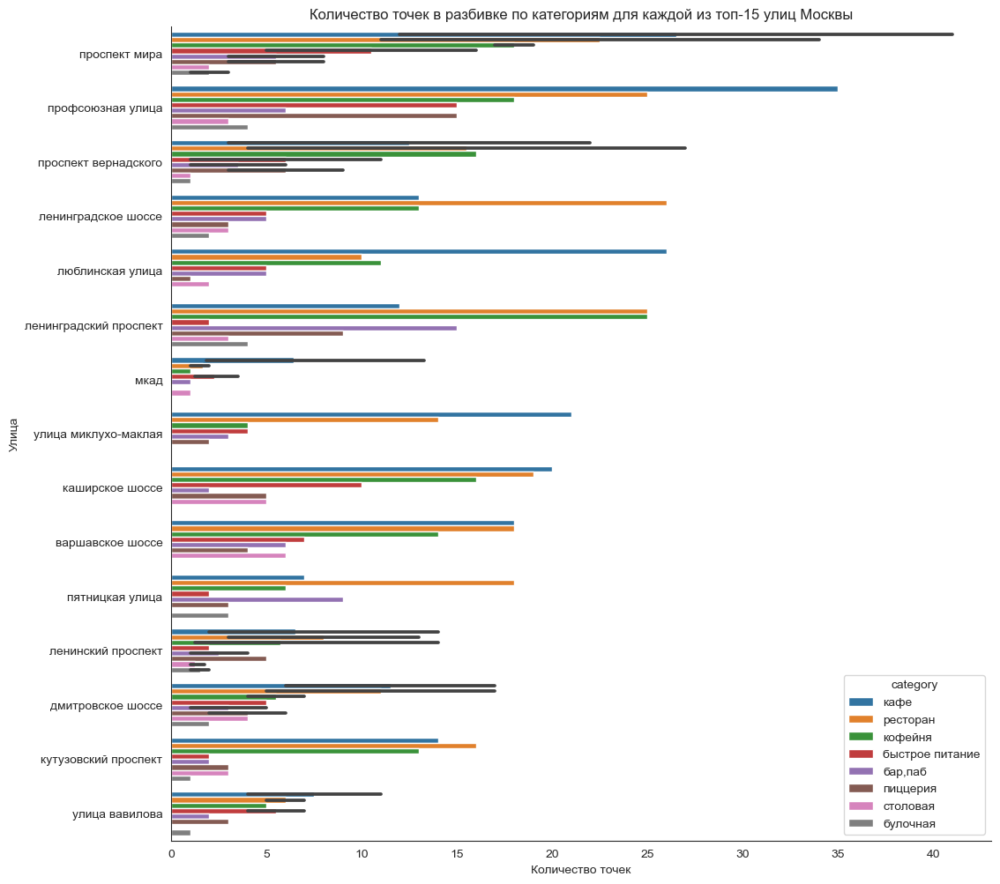

In [93]:
# создаем график
plt.figure(figsize = (12,12))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
sns.barplot(x = 'obj_cnt', 
            y = 'street_name',
            hue = 'category',
            data = top_15_streets_by_cat
           )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Количество точек в разбивке по категориям для каждой из топ-15 улиц Москвы')
plt.xlabel('Количество точек')
plt.ylabel('Улица')

# выводим результат
plt.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

- У лидеров рейтинга - Проспекта Мира и Профсоюзной улицы картина распределения заведений по категориям давольно похожая: в основном *кафе* и *рестораны*, за которыми следуют *кофейни* и *заведения быстрого питания*.
- У их преследователей - Проспека Вернадского, Ленинского и Ленинградского проспектов - кафе отходят на вторые-третьи позиции, а преобладающими становятся *рестораны* и большую значимость приобретают *кофейни*.
- На вылетных магистралях соотношение ресторанов и кафе весьма сопоставимо практически независимо от направления.
- Так-же вес ресторанов довольно значителен в "наиболее" централых и предстижных *Пятницкой улице* и *Кутузовском проспекте*.
- Отстальные улицы из топ-15 с теми или иными вариациями повторяют общее распределение с лидированием *кафе* и преследующей их категорией *ресторанов* и *кофеен*.    


### Улицы Москвы со всего одним заведением общественного питания <a id='step_3.11'></a>

Посмотрим теперь на самую нижнюю честь рейтинга улиц Москвы по количеству заведений общественного питания, который мы собрали в датафрейме streets_tot. В этой ниженей части пердставлены улицы, на всем протяжении которых находится всего 1 объект общественного питания.                 

Выделим эти улицы и посмотрим сколько их.

In [94]:
# выделяем улицы с одним объектом общественного питания
streets_one = streets_tot[streets_tot['obj_cnt'] == 1]

# смотрим сколько их получилось
print( "В Москве", streets_one['street_name'].count(), "улиц с единственным заведением общественного питания" )

В Москве 459 улиц с единственным заведением общественного питания


Посмотрим к каким категорям преимущественно относятся эти заведения общественного питания.

In [95]:
# считаем сколько заведений разных категорий есть на улицах с одним заведением, ранжируем по убыванию количества
streets_one_by_cat = streets_by_cat_dist[streets_by_cat_dist['street_name'] \
                    .isin(streets_one['street_name'])][['street_name', 'category', 'obj_cnt']] \
                    .groupby('category').agg({'obj_cnt': 'sum'}).reset_index() \
                    .sort_values('obj_cnt', ascending=False)

# смотрим что получилось (c градиентом)
streets_one_by_cat.style.background_gradient('Blues')

,category,obj_cnt
3,кафе,160
6,ресторан,89
4,кофейня,85
0,"бар,паб",39
7,столовая,37
2,быстрое питание,23
5,пиццерия,18
1,булочная,8


Визуализируем распределение по категрриям на "улицах с одним заведением" горизонтальной столбцатой диаграммой.

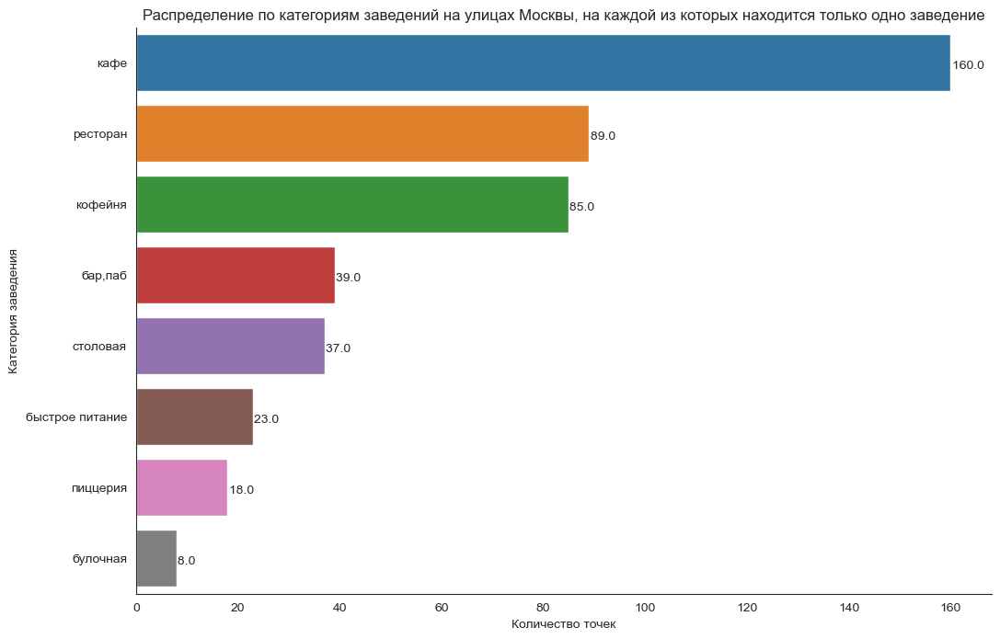

In [96]:
# создаем график
plt.figure(figsize = (12,8))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'obj_cnt', 
                 y = 'category',
                 data = streets_one_by_cat
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Распределение по категориям заведений на улицах Москвы, на каждой из которых находится только одно заведение')
plt.xlabel('Количество точек')
plt.ylabel('Категория заведения')

# добавляем стикеры значений к столбцам
for p in ax.patches :
 _x = p. get_x () + p. get_width () + float(0.2)
 _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
 value = '{:.1f} '. format (p. get_width ())
 ax.text (_x, _y, value, ha= 'left')


# выводим результат
plt.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

- В Москве 459 улиц, на всем протяжении которых имеется только одно заведение общественного питания.
- В подавляющем большинстве (с преимуществом от ближайших преследователей почти в два раза) "единственным на всей улице" оказывается *кафе* (160 заведений/улиц).
- Второе и третье место держат категории *ресторан* и *кофейня* показателем 89 и 85 соответственно.
- Еще две категории - *бар,паб* и *столовая* имеют так-же примерно одинаковые показатели, которые еще в разы меньше, а именно 39 и 37 заведений/улиц соответственно.
- Следующие две категории - *быстрое питание* и *пиццерия* демонстрируют снижение показателей до 23 и 18 соответственно.
- И наконец замыкает рейтинг категория *булочная*, которая является "единственным представителем" сферы общественного питания на всего лишь 8 улицах Москвы.

Посмотрим как распределены по округам Москвы улицы с одним на каждой из них заведением общественного питания, где их больше: в центре или ближе к окраинам.

In [97]:
# считаем сколько улиц/заведний есть в каждом округе Москвы, ранжируем по убыванию их количества
streets_one_by_dist = streets_by_cat_dist[streets_by_cat_dist['street_name'] \
                    .isin(streets_one['street_name'])][['street_name', 'district', 'obj_cnt']] \
                    .groupby('district').agg({'obj_cnt': 'sum'}).reset_index() \
                    .sort_values('obj_cnt', ascending=False)

# смотрим что получилось (c градиентом)
streets_one_by_dist.style.background_gradient('Blues')

,district,obj_cnt
5,Центральный административный округ,144
3,Северо-Восточный административный округ,55
0,Восточный административный округ,53
2,Северный административный округ,51
8,Южный административный округ,43
6,Юго-Восточный административный округ,40
1,Западный административный округ,35
4,Северо-Западный административный округ,19
7,Юго-Западный административный округ,19


Визуализируем распределение "улиц с одним заведением" по округам все той же горизонтальной столбцатой диаграммой.

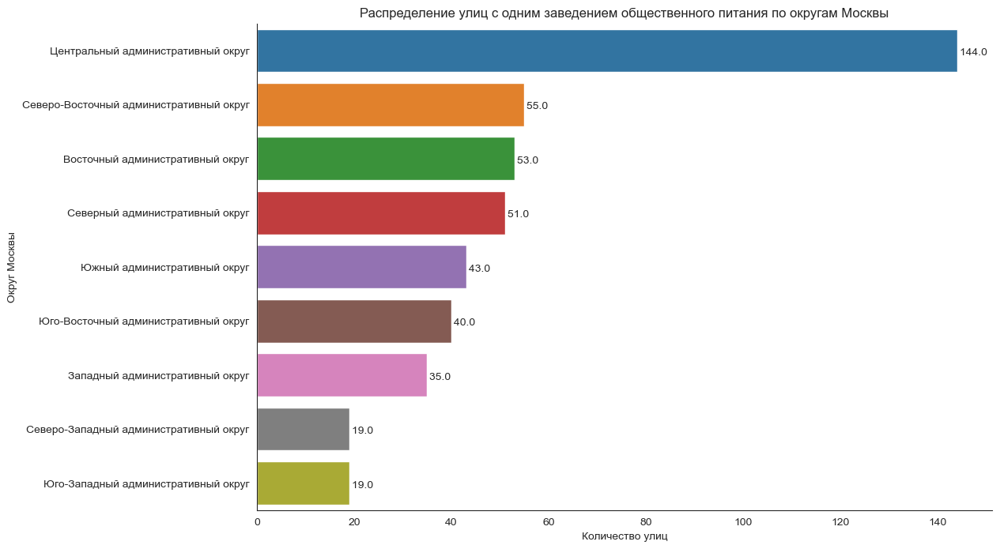

In [98]:
# создаем график
plt.figure(figsize = (12,8))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'obj_cnt', 
                 y = 'district',
                 data = streets_one_by_dist
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Распределение улиц с одним заведением общественного питания по округам Москвы')
plt.xlabel('Количество улиц')
plt.ylabel('Округ Москвы')

# добавляем стикеры значений к столбцам
for p in ax.patches :
 _x = p. get_x () + p. get_width () + float(0.5)
 _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
 value = '{:.1f} '. format (p. get_width ())
 ax.text (_x, _y, value, ha= 'left')


# выводим результат
plt.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

- В этом рейтинге, как и во всех остальных лидирует *Центральный округ* со 144-мя улицами с единственным объектом общественного питания, опережая ближайших преследователей почти в 3 раза. По всей видимости такое положение объясняется тем, что улицы в центре Москвы гораздо короче по протяженности, чем в других округах, далеко не все из них являются "удобно проходными" с большой проходимостью, а за счет общей насыщенности  центра заведениями общественного питания - открывать точки в таких местах невыгодно.
- По остальным округам картина напоминает картину общего количества точек общественного питания: три округа 
    - *Северо-восточный*, 
    - *Восточный* 
    - и *Северный*          
имеют примерно одинаковое количество улиц с одним заведением общепита 55, 53 и 51 соответственно,       
а затем количество таких улиц по округам снижается до минимального значения в 19 улиц в 
    - *Юго-западном* 
    - и *Северо-Западном* округах.

### Распределение средней стоимости заказа в заведениях общественного питания по округам Москвы <a id='step_3.12'></a>

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном.  

Для начала посчитаем медиану среднего чека по всем заведениям Москвы.

In [99]:
# вычисляем медиану среднего чека по заведениям округа
med_bill_by_tot = data['middle_avg_bill'].median() 


# выводим результат
print( "Средний чек в заведениях общественного питаний Москвы составляет", med_bill_by_tot, "рублей")

Средний чек в заведениях общественного питаний Москвы составляет 750.0 рублей


Теперь сгруппируем заведения по округам Москвы и посчитаем медиану этого столбца для каждого округа.

In [100]:
# группируем заведения по округам и вычисляем медиану среднего чека по заведениям округа
med_bill_by_dist = data.groupby('district').agg({'district_id': 'first', 'middle_avg_bill': 'median'}) \
                       .reset_index().sort_values('middle_avg_bill', ascending=False)

# для удобства поменяем названия столбцов
med_bill_by_dist.columns = ['district', 'district_id', 'median_avg_bill']

# смотрим что получилось (с градиентом)
med_bill_by_dist[['district', 'median_avg_bill']].style.background_gradient('Blues')

,district,median_avg_bill
1,Западный административный округ,1000.000000
5,Центральный административный округ,1000.000000
4,Северо-Западный административный округ,700.000000
2,Северный административный округ,650.000000
7,Юго-Западный административный округ,625.000000
0,Восточный административный округ,575.000000
3,Северо-Восточный административный округ,500.000000
8,Южный административный округ,500.000000
6,Юго-Восточный административный округ,450.000000


Визуализируем распределение медианных значений среднего чека заведения по округам горизонтальной столбцатой диаграммой ...

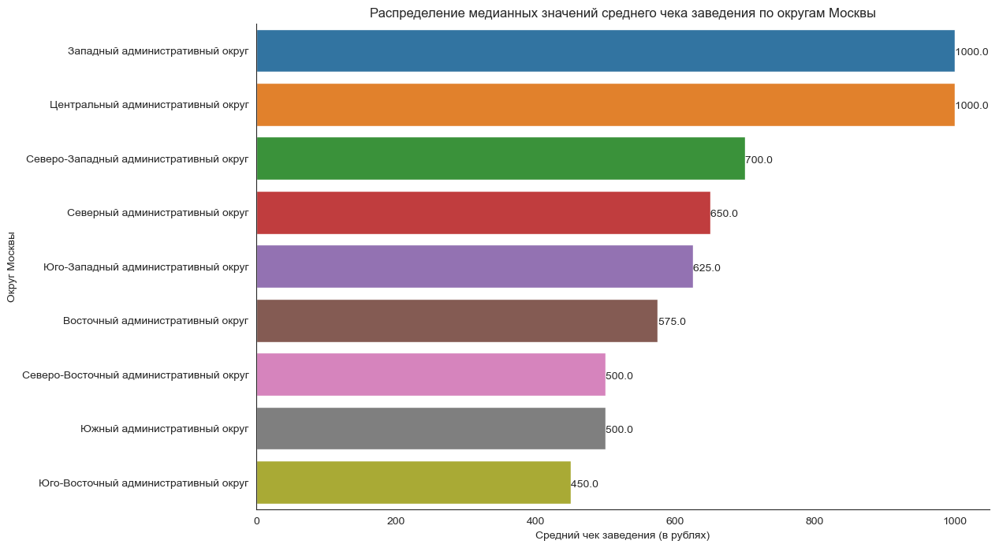

In [101]:
# создаем график
plt.figure(figsize = (12,8))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'median_avg_bill', 
                 y = 'district',
                 data = med_bill_by_dist
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Распределение медианных значений среднего чека заведения по округам Москвы')
plt.xlabel('Средний чек заведения (в рублях)')
plt.ylabel('Округ Москвы')

# добавляем стикеры значений к столбцам
for p in ax.patches :
 _x = p. get_x () + p. get_width () + float(0.5)
 _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
 value = '{:.1f} '. format (p. get_width ())
 ax.text (_x, _y, value, ha= 'left')


# выводим результат
plt.show()

...   
И построим фоновую картограмму (хороплет) с медианными значениями среднего чека заведения для каждого округа Москвы.

In [102]:
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data = state_geo,
    data = med_bill_by_dist,
    columns = ['district_id', 'median_avg_bill'],
    key_on='feature.id',
    fill_color='Blues',
    fill_opacity=0.5,
    legend_name = 'Средний рейтинг заведений по округам Москвы',
).add_to(m3)

# выводим карту
m3

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 

- Показатели медианных значений средней стоимости заказа заведений общественного питания распределены по различным округам Москвы в соответствии с с общей традицией оценки престижности районов Москвы, а так-же с уровнем деловой активности в округах (наличие офисов различных фирм, обилием различных бизнес-встреч, интенсивностью перемещения людей и т.д.).
- В *Центральном* и *Западном* округах медианные значения средних чеков заведений одинаковы и составляют 1000 рублей;
- В чуть менее престижных, но с насыщенной деловой активностью *Северо-западном* *Северном* и *Юго-западном* округах медианные показатели среднего чека уже ниже и составляют 700, 650 и 625 рублей соответственно.
- По мере снижения престижности округа и его большей "промышленной" ориентации средние чеки заведений снижаются от 575 рублей в *Восточном* округе до 450 рублей в *Юго-восточном* округе.
    
- В целом можно утверждать, что в Москве средняя стоимость обслуживания в заведениях общественного питания снижается по мере удаления от центра города (особенно в направлении юг, юго-восток и северо-восток). В более удаленных районах цены в среднем ниже, чем в центре города. 

## Общие выводы по результатам исследования: <a id='conclusions'></a>

<div style="border:solid #d9d9d9 5px; padding: 10px"> 


**Проект заказан** инвесторами фонда «Shut Up and Take My Money». 

**Цель проекта:**                         
Провести исследование рынка объектов общественного питания Москвы (и в особенности кофеен), найти интересные особенности и дать заказчикам рекомендации, которые помогут им в выборе места и формата отрываемого ими заведения.

**Задачи, решаемые в ходе проекта:**                   
• изучить количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее,         
• узнать количество посадочных мест в объектах общественного питания и их часы работы,             
• определить значения средних чеков заведений,                
• провести разбиение на сетевые и индивидуальные точки общественного питания, определить наиболее популярные сети,         
• изучить распределение объектов по административным районам Москвы.

**Данные для проекта** представлены в виде датасета с параметрами объектов общественного питания Москвы, составленного на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

**Этапы проекта** представлены в виде шагов в [оглавлении](#content).

**Результатами проекта** являются выводы, раскрывающие закономерности и особенности рынка общественного питания в Москве (с более подробным описанием рынка кофеен) и рекомендации заказчикам по возможному месту и формату новой точки общественного питания. Результаты так-же оформлены в виде презентации, ссылка на нее [ниже](#presentation). 



### 1. Были проанализированы предоставленные данные
 
Представленный датасет содержит информацию о 244126-и событиях/действиях, совершенных 7551-м пользователем приложения.                
Данные представлены в виде таблицы - датафрейма, включающего в себя 8406 строк и 14 столбцов.

В соответствии с описанием датафрейм содержит следующие столбцы - характеристики конкретных объектов общественного питания:
 - name — название заведения;
 - category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
 - address — адрес объекта;
 - district — административный район, в котором находится объект;
 - hours — информация о днях и часах работы;
 - lat — широта географической точки, в которой находится объект;
 - lng — долгота географической точки, в которой находится объект;
 - rating — рейтинг заведения по оценкам пользователей в Яндекс Картах;
 - price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
 - avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;
 - middle_avg_bill — число с оценкой среднего чека (только для значений «Средний счёт» из столбца avg_bill);
 - middle_coffee_cup — число с оценкой одной чашки капучино (только для значений «Цена чашки капучино» из столбца avg_bill);
 - chain — индикатор того, является ли заведение сетевым;
 - seats — количество посадочных мест.

Датафрейм содержит 8406 строк - собственно точек общественного питания.           
При этом уникальных названий заведений 5614, что говорит о том, что среди восьми тысяч представленных точек питания заметную долю занимают сетевые объекты.
Из 8406 заполненных строк в колонке адреса уникальных всего 5753, что значит, что многие заведения расположены "кустами" в бизнес- и торговых центрах.
В датасете представлены 8 категорий объектов общественного питания: кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',  'быстрое питание', 'булочная' и 'столовая'.
Количество уникальных значений столбца "district" равно 9, что соответствует количеству административных округов г.Москвы за исключением Зеленограда и Новой Москвы.
В среднем в заведениях общественного питаний Москвы 108 посадочных мест, однако медиана ниже - 75 мест. При этом есть  заведения с 1000+ местами.
 
В целом представленная выборка была полна и репрезентетивна. 
Однако в процессе изучения данных выяснилось, что данные по ценовой категории заведений общественного питания сформированы безсистемно и полагаться на них при анализе нельзя.


### 2. Была проведена необходимая предобработка данных для проведения анализа:
             
 - преобразованы типы данных в столбцах;           
 - обработаны текстовые данные (регистр, лишние пробелы, служебные символы и т.п.);               
 - проверены и обработаны пропуски и удалены дубликаты;                    
 - обработаны или удалены данные с аномальными (ошибочными) значениями;                   
 - добывлены столбец с названием улицы местоположения заведения и столбец с индикатором режима работы заведения 24/7; .   

После проведения предобработки в датафрейме осталось 8301 запись без пропусков и повторов, что является достаточно репрезентативной выборкой для проведения анализа.

### 3. Был проведен исследовательский анализ данных . 

Выявлено следующее:   

###### 3.1 Соотношение категорий объектов общественного питания:
 - Больше всего заведений  относится к категории кафе - 2364 точки из 8301, что составляет 28.5%;
 - В тройку "лидеров" так-же входят рестораны - 1959 точек или 23.6% и кофейни с 1413 точками или 17.0%. Суммарно тройка      лидеров составляет 69.1% от общего количества точек общественного питания в Москве;
 - Категории, занимающие места с 4-го по 6-е - бар,паб(764 точки, 9.2%), пиццерия(631 точки, 7.6%) и заведения быстрого        питания(602 точки, 7.3%) уступают лидерам в разы и суммарно составляют 24.1%;
 - Явными аутсайдерами среди категорий являются столовые с 312 объектами (3.8%) и замыкающая таблицу категория булочная с      256 точками т.е. 3.1% от общего количества.
 
###### 3.2 Количество посадочных мест в различных категориях объектов общественного питания:
 - Лидером по количеству посадочных мест является категория ресторан, медианное значение количества мест в этой категории равно 87;
 - За ресторанами довольно близко следуют категории бар,паб и кофейня с 81-м и 80-ю посадочными местами соответственно;
 - Четвертым с примерно таким же отрывом в 5 мест удет категория столовых - у нее 75 мест в медиане;
 - Отрыв пятого места - заведений быстрого питания составляет уже 10 мест и далее на ней с отставанием в 5 посадочных мест идут последовательно категории кафе, пиццерия и замыкающая рейтинг категория булочная (с 50 -ю местами).

Таким образом можно утверждать, что хотя в категориях ресторан, бар,паб, кофейня и быстрое питание имеют количество посадочных мест, близкое к 300-м и даже есть заведения с более чем 1000 мест, все-таки наиболее типичный формат заведения общественного питания для Москвы с точки зрения количества посадочных мест - это заведение с 50-100 посадочными местами.

###### 3.3 Соотношение сетевых и несетевых заведений общественного питания 
 - Среди заведений общественного питания в Москве преобладают несетевые заведения в пропорции 62.3% несетевых (5131 заведение) 37.7% сетевых (3130 заведений).

###### 3.4 Соотношение категорий сетевых заведений общественного питания:                     
 - В самых многочисленных категориях - кафе и ресторанах доля сетевых заведений 35-40%;                       
 - Такую же долю сетевых заведений можно наблюдать и в категориибыстрое питание, хотя интуитивно казалось, что доля            "сетевиков" здесь должна быть гораздо выше;                              
 - В категориях бар,паб и столовая долю несетевых заведений можно назвать доминирующей - около 80%;              
 - В так-же относительно массовых категориях кофейня и пиццерия картина отклоняется в другую сторону: доля сетевых            заведений в этих категориях уже превышает долю несетевых примерно от 0 до 5%;                  
 - Наиболее ярко эта тенденция выражена в наименее распространенной категории булочных здесь доля сетевых заведений            составляет уже порядка 60%.

###### 3.5 Топ-15 наиболее популярных сетей общественного питания в Москве:                     
 - Всего заведения из топ-15 наиболее популярных сетевых заведений общественного питания в Москве включают в себя 771 точку    обслуживания;                                          
 - Среди заведений топ-15 преобладают кофейни и кафе: из 5 и 4 из 15 соответственно;                                       
 - Остальные категории представлены в топ-15 одним (как точки быстрого питания и булочные) или двумя (как пиццерии и рестораны) заведением;              
 - Фактически в топ-15 нет ни одного классического ресторана, поскольку "Prime" и "Теремок", которые значатся в этом списке    как рестораны, представляют собой скорее небольшие "бутербродные", специализирующиеся на "обеденном перекусе" и            ресторанами их можно назвать лишь условно;                              
 - Так-же обращает внимание отсутствие в списке "бросающихся в глаза" в Москве ресторанов быстрого питания, таких как          "Ростикс", "Вкусно и точка", "Бургер-кинг". Это удивительно, поскольку интуитивно видится, что у каждой из этих сетей      точек присутствия в Москве должно быть больше, чем 24 (это последний член топ-15). Вместо этого категория быстрого          питания в списке представлена непонятным заведением с общим названием "Хинкальная", из которого непонятно, действиетльно    ли это одна сеть или просто случайный набор заведений с одинаковым смысловым обозначением;
 
 - Явным лидером поименного рейтинга является кофейня "Шоколадница";           
 - За которой следуют две наиболее популярных пиццерии "Домино-с" и "Додо";              
 - За ними вновь идут две популярных сети кофеен - "one price coffee" и "cofix;                     
 - Замыкает рейтинг топ-15 довольно специфическая сеть кафе - "drive café", базирующаяся на сети автозаправок ГазПромНефти.
 
###### 3.6 Соотношение средних рейтингов разных категорий заведений:                            
 - Распределение довольно ровное: средние рейтинги колеблются по категориям от 4.0 до 4.4;                              
 - Самые высокие показатели рейтинга у баров и пабов (4.4);                                          
 - Рейтинг чуть ниже - 4.3 имеют сразу 4 категории заведений: рестораны, пиццерии, кофейни и булочные;                     
 - Еще чуть ниже имеют рейтинги категории столовая и кафе (4.2 и 4.1 соответственно);                  
 - Замыкает рейтинг категория быстрое питание, которая например в топ-15 представлена сетью хинкальных и по всей видимости    минимальный рейтинг этой категории связан с излишней для Москвы "демократичностью" такого рода заведений как по качеству    еды, так и по качеству обслуживания. 

###### 3.7 Распределение объектов общественного питания по округам Москвы:                              
 - В распределении заведений общественного питания по округам в Москве очевидно доминирует Центральный округ с 2234            заведениями, что составляет 26.9% от всего количества точек общественного питания в Москве;                          
 - Уступая лидеру в 2.5 раза 4 округа имеют на своей територии примерно по 850 объектов общественного питания.         
   Это следующие округа:                
      - Северный округ с 892 объектами или 10.7%,         
      - Северо-восточный округ - 880 объектов или 10.6%,             
      - Южный округ - 877 объектов или 10.6%,                
      - Западный округ - 838 объектов или 10.1%;                
  - У следующих 3-х округов идет снижение количества объектов на территории округов с 800 до менее 700:  
      - Восточный округ - 780 объектов или 9.4%,
      - Юго-восточный округ - 705 объектов или 8.5%,
      - Юго-западный округ - 694 объектов или 8.4%;                            
 - Явным аутсайдером выглядит Северо-западный округ, имея на своей территории только 401 заведение, что составляет 4.8% от    всего количества объектов общественного питания в Москве.            

При этом:
 - Доминирование Центрального округа по количеству объектов общественного питания над другими округами Москвы особенно ярко    проявляется в категориях ресторанов, кофеен и баров/пабов. В этих категориях преследователи отстают в разы.           
     - в категории кофейня разрыв с ближайшим преследователем - Северным округом составляет 2 с лишним раза,     
     - в категории ресторан разрыв с преследователем - Западным округом составляет 3с лишним раза,       
     - а в категории бар,паб разрыв с идущим на втором месте Южным округом составляет около 5 с половиной раз;            
 - Довольно существенное превосходство Центрального округа над остальными округами наблюдавется и в категориях кафе и          пицерий. В этих категориях отрыв уже не в разы, но на десятки процентов:                         
     - в категории кафе отрыв от ближайшего преследователя - Юго-восточного округа составляет около 60-65%,      
     - в категории пиццерия отрыв от Юго-восточного округа - примерно 40 45%;             
 - В остальных категориях преимущество Центрального округа вполне заметно, но не является же столь явным.  
 - Сама по себе картина распределения заведений по категориям в Центрального округе выглядит несколько иначе, нежели в        других округах Москвы: здесь заметно лидирует категория *ресторанов* (с опережением около 35-40%), в то время как в        остальных округах лидером является категория *кафе* (опережающая остальные категории примерно в той же пропорции). 

Соотношение сетевых и несетевых заведений распределено по округам Москвы довольно равномерно

 - Максимальная доля сетевых заведений в Центральном и Западном округах - около 40%;
 - Минимальная доля сетевых заведений в Южном и Юго-восточном округах - около 35%;
 - Остальные округа варьируется примерно от 35% до 40%.
По околичеству заведений Центральный округ доминирует как среди сетевых, так и среди несетевых заведений.
Минимальное количество опять же как сетевых так и несетевых заведений в Северо-западном округе.

Картина распределения заведений из топ-15 практически один в один повторояет общеую картину распределения всех заведений общественного питания по округам: 
 - Центральный округ доминирует, 
 - Остальные существенно уступают, 
 - Замыкает рейтинг Северо-западный округ, уступая лидеру в 5 раз.
При этом есть специфика распределения точек конкретных сетей из топ-15 по округам Москвы:
 - У крупнейшей сети - Шоколадницы картина похожа на общее респределение объектов бщественного питания с отрывом              Центрального окруда вдвое от остальных и затем постепенное снижение количества точек по остальным округам. Единственное    отличие, которое бросается в глаза - это очень малое количество точек в Юго-западном округе;
 - Примерно такую же картину демонстрирует one price coffee (но уже без "провала" в Юго-западщном округе;
 - У сети ресторанов Prime и у Кулинарной лавки братьев Караваевых практически все объекты сети сосредоточены в Центральном    округе;            
 - Несколько менее выраженная, но аналогичная картина и у кафе Му-му, кофейни Кофепорт и у сети быстрого питания              Хинкальная;                
 - У сетей пиццерий Доминос пицца и Додо пицца картина обратная - сети довольно хорошо представлены по всем округам Москвы    и Цетральный округ у них скорее у аутсайдерах, нежели в лидерах;              
 - Аналогичная картина практически во всех остальных заведениях из топ-15;                
 - Так-же в топ-15 есть заведения: сеть булочных Буханка и сеть авто-кафе Drive café, которые представлены не во всех          округах Москвы ( в 7 и 6 из 9 соответственно).
 
###### 3.8 Фоновая картограмма (хороплет) со средним рейтингом заведений по округам Москвы:                                                 
 - Наивысший рейтинг среди округов Москвы имеет Центральный округ - 4.38;               
 - Вторым следует Северный округ с рейтингом 4.24;           
 - Нименьший рейтинг у Юго-восточного округа - 4.11;             
 - Остальные округа располагаются между ними и имеют рейтинги 4.15 - 4.20.
 
###### 3.9 Распределение всех заведений общественного питания на карте Москвы по кластерам:                                                 
 - Наиболее плотное сосредоточение заведений общественного питания находится в Центральном округе,      
   что неудивительно, учитывая структуру людских потоков в Москве (включая туристические потоки);                        
 - По остальным округам плотность заведений в три-четыре раза меньше и сопоставимы между этими округами.          

###### 3.10 Топ-15 улиц Москвы по количеству заведений общественного питания:                                                 
 - В рейтинге самых "насыщенных" заведениями общественного питания в Москве уверенно ( с запасом в полтора раза) лидирует      Проспект Мира. Вполне возможно, что на результат вляиет ее протяженность и туристическая насыщенность (например ВДНХ);   
 - Ближайшим преследователем лидера является Профсоюзная улица с 121- заведением;        
 - Кроме двух лидеров больше сотни точек общественного питания расположены так-же на проспекте Вернадсткого и Ленинском        проспекте;                  
 - Так-же в топ-15 входят большитнство "вылетных магистралей" Москвы: Дмитровское, Каширское, Варшавское и Ленинградское      шоссе, а так-же Кутузовский проспект;       
 - Кроме них в топ-15 входит МКАД. Думается - в основном за счет её общей протяженности, обилия кафе на заправках    и        наличие торговых молов;                 
 - На удивление среди топ-15 нет ни одной чентральной улицы Москвы (самая близкая к центра - Пятрницкая улица, что по всей    видимостиобъясняется их относительно небольшой протяженностью: даже при высокой плотности на них "не помещается" столь      много заведений;
 - Замыкает рейтинг улица Миклухо-Маклая с 48-ю заведениями общественного питания, расположенными на ней. 

При этом с точки зрения категории заведений
 - У лидеров рейтинга - Проспекта Мира и Профсоюзной улицы картина распределения заведений по категориям давольно похожая:    в основном кафе и рестораны, за которыми следуют кофейни и заведения быстрого питания;      
 - У их преследователей - Проспека Вернадского, Ленинского и Ленинградского проспектов - кафе отходят на вторые-третьи позиции, а преобладающими становятся рестораны и большую значимость приобретают кофейни;         
 - На вылетных магистралях соотношение ресторанов и кафе весьма сопоставимо практически независимо от направления;     
 - Так-же вес ресторанов довольно значителен в "наиболее" централых и предстижных Пятницкой улице и Кутузовском проспекте; 
 - Отстальные улицы из топ-15 с теми или иными вариациями повторяют общее распределение с лидированием кафе и преследующей    их категорией ресторанов и кофеен
 
###### 3.11 Улицы Москвы со всего одним заведением общественного питания:                                                 
 - В этом рейтинге, как и во всех остальных лидирует Центральный округ со 144-мя улицами с единственным объектом              общественного питания, опережая ближайших преследователей почти в 3 раза. По всей видимости такое положение объясняется    тем, что улицы в центре Москвы гораздо короче по протяженности, чем в других округах, далеко не все из них являются        "удобно проходными" с большой проходимостью, а за счет общей насыщенности центра заведениями общественного питания -        открывать точки в таких местах невыгодно;                        
 - По остальным округам картина напоминает картину общего количества точек общественного питания: три округа 
     - Северо-восточный, Восточный и Северный 
   имеют примерно одинаковое количество улиц с одним заведением общепита 55, 53 и 51 соответственно, 
   а затем количество таких улиц по округам снижается до минимального значения в 19 улиц в 
     - Юго-западном и Северо-Западном округах.

При этом с точки зрения категории заведений
 - В подавляющем большинстве (с преимуществом от ближайших преследователей почти в два раза) "единственным на всей улице"      оказывается кафе (160 заведений/улиц);              
 - Второе и тетье место держат категории ресторан и кофейня показателем 89 и 85 соответственно;           
 - Еще две категории - бар,паб и столовая имеют так-же примерно одинаковые показатели, которые еще в разы меньше, а именно    39 и 37 заведений/улиц;            
 - Следующие две категории - быстрое питание и пиццерия демонстрируют снижение показателей до 23 и 18 улиц;         
 - Замыкает рецтинг категория булочная, которая является "единственным представителем" сферы общественного питания всего      лишь на 8 улицах Москвы.

###### 3.12 Распределение стоимости заказа в заведениях общественного питания по округам Москвы:                                                 
 - В целом в Москве средняя стоимость обслуживания в заведениях общественного питания снижается по мере удаления от центра    города (особенно в направлении юг, юго-восток и северо-восток). В более удаленных районах цены в ниже, чем в центре;     
 - Показатели медианных значений средней стоимости заказа заведений общественного питания распределены по различным округам    Москвы в соответствии с с общей традицией оценки престижности районов Москвы, а так-же с уровнем деловой активности в      округах (наличие офисов различных фирм, обилием различных бизнес-встреч, интенсивностью перемещения людей и т.д.);      
 - В Центральном и Западном округах медианные значения средних чеков заведений одниковы и составляют 1000 рублей;          
 - В чуть менее престижных, но с насыщенной деловой активностью Северо-Западном Северном и Юго-Западном округах медианные      показатели среднего чека уже ниже и составляют 700, 650 и 625 рублей соответственно);          
 - По мере снижения престижности округа и его большей "промышленной" ориентации средние чеки заведений снижаются от 575        рублей в Восточном округе до 450 рублей в Юго-восточном округе.      


### Таким образом

##### Кратко можно констатировать следующее:

 - Наибольшее количество заведений общественного питания в Москве - это кафе, рестораны и кофейни;
 
 - Наиболее типичный формат заведения общественного питания для Москвы с точки зрения количества посадочных мест - это заведение с 50-100 посадочными местами;
 
 - Сетевые заведения составляют чуть больше одной трети всех заведений общественного питания. Крупнейшие сети - кофейня        "Шоколадница" и пиццерии "Домино-с пицца" и "Додо пицца";
 
 - Средние рейтинги колеблются по категориям от 4.0 до 4.4, самые высокие рейтинги у баров и пабов, самые низкие - у          заведений быстрого питания, рейтинг большинства заведений - в пределах 4.2 - 4.3;  
 
 - Центральный округ значительно превосходит остальные округа Москвы по количеству заведений общественного питания всех        категорий, сетевых и несетевых, включая крупнейшие сети: суммарно 2234 заведения или 27%. По всей видимости это связано    с более плотными людскими потокам в центре, более высокой деловой и туристической активностью;     
 
 - Среди всех улиц Москвы самой насыщенной заведениями общественного питания является Проспект Мира ( 183 заведения).          Вполне возможно, что на результат вляиет ее протяженность и туристическая насыщенность (например ВДНХ). Кроме нее          больше сотни точек общественного питания расположены так-же на Профсоюзной улице, проспекте Вернадского и Ленинском        проспекте;    
 
 - В Москве 459 улиц, на всем протяжении которых имеется только одно заведение общественного питания. В подавляющем            большинстве это заведение - кафе (на 160 улицах).        
   Наличие таких улиц может быть связано с различными причинами: в центральной    части - это может быть недостаточная        длина и "вместительность" улиц в сочетании с общим высоким уровнем конкуренции, а на окраинах причина этого может быть в    низком уровне проходимости на этой улице и соответственно с недостаточным для окупаемости спросом;   
   
 - Средняя стоимость обслуживания в заведениях общественного питания Москвы снижается по мере удаления от центра города. Самый высокий средний чек в Центральном и Западном округах (1000 рублей), самый низкий - в Юго-восточном округе (450 руб.).


## Шаг 4. Открытие Кофейни: детальное исследование рынка кофеен в Москве <a id='step_4'></a>

В задании на проект заказчики дали понять, что заинтересованы в открытии именно кофейню и просили уделить более пристальное внимание этой категории и ответить на следующие вопросы:
- Сколько всего кофеен в датасете? 
- В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Попробуем последовательно разобраться в этих вопросах

### Сколько всего кофеен в датасете? В каких районах кофеен больше всего, каковы особенности их расположения?  <a id='step_4.1'></a>

Выделим из нашего основного датафрейма data все заведения с категорией "кофейня" и псчитаем количество строк в получившшемся датасете.

In [103]:
# выделяем категорию кофеен
coffee_shops = data[data['category'] == 'кофейня']

# смотрим сколько их
print( 'В Москве всего', len(coffee_shops), 'кофеен')

В Москве всего 1413 кофеен


Сгруппируем кофейни по округам Москвы и посчитаем сколько их в каждом округе.

In [104]:
# группируем заведения по округам и вычисляем их количество
coffee_shops_by_dist = coffee_shops.groupby('district') \
                                   .agg({'name':'count'}) \
                                   .reset_index() \
                                   .sort_values('name', ascending=False)

# создаем столбец с долей (%) каждого округа в общем количестве
coffee_shops_by_dist['share'] = round( 100 * coffee_shops_by_dist['name'] \
                                      / coffee_shops_by_dist['name'].sum() , 1)


# смотрим что получилось (с градиентом)
coffee_shops_by_dist.style.background_gradient('Blues')

,district,name,share
5,Центральный административный округ,428,30.300000
2,Северный административный округ,193,13.700000
3,Северо-Восточный административный округ,159,11.300000
1,Западный административный округ,150,10.600000
8,Южный административный округ,131,9.300000
0,Восточный административный округ,105,7.400000
7,Юго-Западный административный округ,96,6.800000
6,Юго-Восточный административный округ,89,6.300000
4,Северо-Западный административный округ,62,4.400000


Визуализируем распределение горизонтальной столбчатой диаграммой.

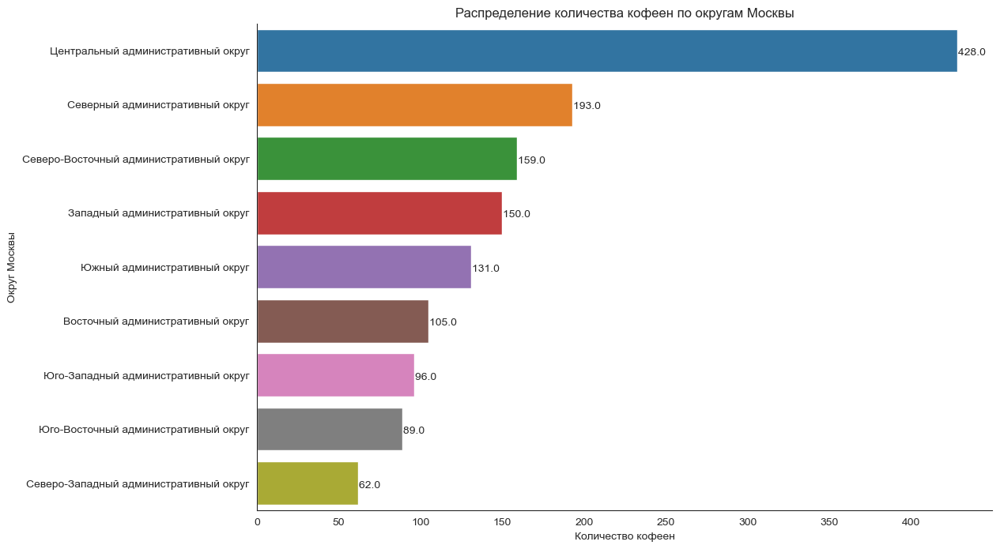

In [105]:
# создаем график
plt.figure(figsize = (12,8))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'name', 
                 y = 'district',
                 data = coffee_shops_by_dist
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Распределение количества кофеен по округам Москвы')
plt.xlabel('Количество кофеен')
plt.ylabel('Округ Москвы')

# добавляем стикеры значений к столбцам
for p in ax.patches :
 _x = p. get_x () + p. get_width () + float(0.5)
 _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
 value = '{:.1f} '. format (p. get_width ())
 ax.text (_x, _y, value, ha= 'left')


# выводим результат
plt.show()

Визуализируем распределение долей округов в общем количестве круговой диаграммой.

In [106]:
pie = go.Pie(labels= coffee_shops_by_dist['district'],
             values= coffee_shops_by_dist['share']
            )

layout = go.Layout(template='seaborn',
                   title = 'Доли округов Москвы по количеству кофеен')
fig = go.Figure(data = [pie], layout = layout)
fig.show()

Посмотрим так-же как это выглядит на карте сгруппировав их в кластера.

In [107]:
# создаём карту Москвы
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m4)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_shops.apply(create_clusters, axis=1)

# выводим карту
m4

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 
    
- В Москве в общей сложности 1413 заведений категории кофейня.    

- Максимальное количество кофеен расположено в *Центральном округе* - 424 заведения, что составляет 30.3% от общего количества; 
- На территории *Северного округа* уже насчитывается гораздо меньше кофеен - 193 объекта или 13.7%,
- *Северо-восточный округ* располагает 159 кофейнями или 11.3%,
- В *Западном округе* кофеен 150 или 10.6%,
- В *Южном округе* - 131 кофейня или 10.6%,
- У *Восточного*, *Юго-западного* *Юго-восточный* округов показатели примерно одинаковые - 105, 96 и 89 заведений сответственно ( это ококло 7% у каждого);           
- На удивление аутсайдером в этом сегменте выглядит *Северо-западный округ*, имея на своей территории только 62 кофейни, что составляет 4.4% от всего количества кофеен в Москве;
    
- Судя по карте общее направление высокой плотности кофеен на территории Москвы - с севера и северо-востока через максимально насыщенный центр на юг и на запад, минуя восток, юго-восток, часть юга и что удивительно - северо-запад.  

### Есть ли в Москве круглосуточные кофейни?  <a id='step_4.2'></a>

Для определения круглосуточных кофеен воспользуемся созданным нами ранее столбцом "is_24_7", отфильтруем круглосуточные кофейни и посчитаем их количество.

In [108]:
# выделяем круглосуточно работающие кофейни
coffee_shops_24_7 = coffee_shops[coffee_shops['is_24_7'] == True]

# смотрим сколько их
print( "В Москве всего", len(coffee_shops_24_7), "круглосуточно работающих кофеен")
print( "Доля круглосуточно работающих кофеен из их общего количества составляет", \
      round(100 *len(coffee_shops_24_7) / len(coffee_shops), 1), "%")

В Москве всего 59 круглосуточно работающих кофеен
Доля круглосуточно работающих кофеен из их общего количества составляет 4.2 %


Посмотрим как эти круглосуточные кофейни распределены по округам Москвы.

In [109]:
# группируем заведения по округам и вычисляем их количество
coffee_shops_24_7_by_dist = coffee_shops_24_7.groupby('district') \
                                             .agg({'name':'count'}) \
                                             .reset_index() \
                                             .sort_values('name', ascending=False)

# создаем столбец с долей (%) каждого округа в общем количестве
coffee_shops_24_7_by_dist['share'] = round( 100 * coffee_shops_24_7_by_dist['name'] \
                                           / coffee_shops_24_7_by_dist['name'].sum() , 1)


# смотрим что получилось (с градиентом)
coffee_shops_24_7_by_dist.style.background_gradient('Blues')

,district,name,share
5,Центральный административный округ,26,44.100000
1,Западный административный округ,9,15.300000
7,Юго-Западный административный округ,7,11.900000
0,Восточный административный округ,5,8.500000
2,Северный административный округ,5,8.500000
3,Северо-Восточный административный округ,3,5.100000
4,Северо-Западный административный округ,2,3.400000
6,Юго-Восточный административный округ,1,1.700000
8,Южный административный округ,1,1.700000


Визуализируем распределение горизонтальной столбчатой диаграммой.

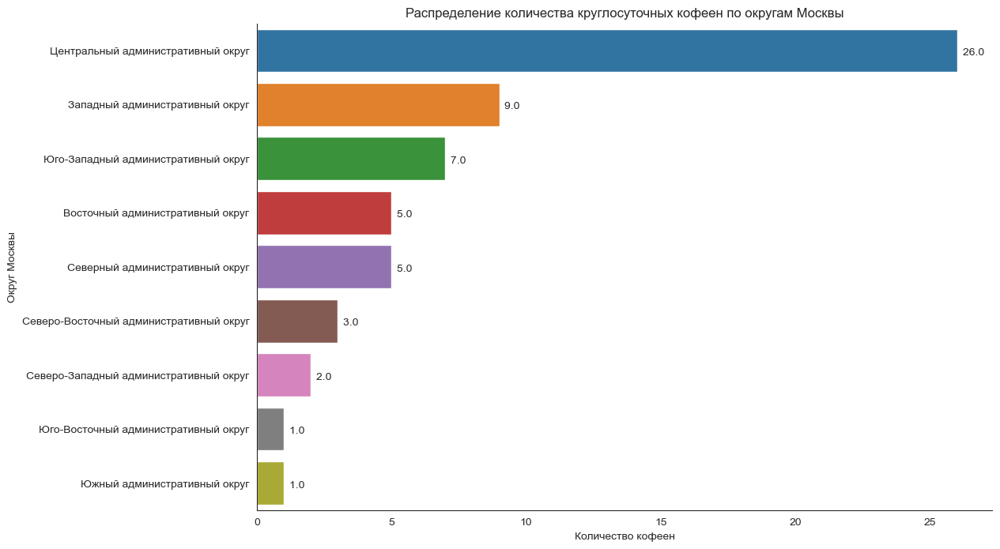

In [110]:
# создаем график
plt.figure(figsize = (12,8))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'name', 
                 y = 'district',
                 data = coffee_shops_24_7_by_dist
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Распределение количества круглосуточных кофеен по округам Москвы')
plt.xlabel('Количество кофеен')
plt.ylabel('Округ Москвы')

# добавляем стикеры значений к столбцам
for p in ax.patches :
 _x = p. get_x () + p. get_width () + float(0.2)
 _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
 value = '{:.1f} '. format (p. get_width ())
 ax.text (_x, _y, value, ha= 'left')


# выводим результат
plt.show()

Визуализируем распределение долей круговой диаграммой.

In [111]:
pie = go.Pie(labels= coffee_shops_24_7_by_dist['district'],
             values= coffee_shops_24_7_by_dist['share']
            )

layout = go.Layout(template='seaborn',
                   title = 'Доли округов Москвы по количеству круглосуточных кофеен')
fig = go.Figure(data = [pie], layout = layout)
fig.show()

Посмотрим так-же как это выглядит на карте сгруппировав их в кластера.

In [112]:
# создаём карту Москвы
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m5)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_shops_24_7.apply(create_clusters, axis=1)

# выводим карту
m5

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 
    
- В Москве из 1413 кофеен всего 59 работают круглосуточно. Это чуть больше 4 поцентов (4.2%).

- Из 59 круглосуточных кофеен в Москве 26 или 44.1% находится в *Центральном округе*;
- У идущего на втором месте *Западного округа* таких кофеен уже всего 9 или 15.3% от общего количества таких кофеен;
- В *Юго-западном* округе круглосуточно работают только 7 кофеен (или 11.9%);
- В *Восточном* и *Северном* округах таких заведений по 5 (или по 8.5%);
- В *Северо-восточном* округе их 3; 
- В *Северо-западном* - две;
- и в *Юго-восточном* и *Южном* округах круглосуточных кофеен всего по одной на округ.
    
Конечно необходимо анализировать людские потоки в различное время и в различных местах по округам Москвы, но навскидку видится, что и общий процент (4.2%) круглосуточных кофеен в Москве очень невысок, и концентарция таких в основном в центре открывает хорошие возможности по открытию круглосуточных кофеен практически во всех "нецентральных" округах Москвы. Особенно Север, Северо-восток, юг и Юго-восток выглядят явно "недоосвоенными".  

### Какие у кофеен рейтинги? Как они распределяются по районам?  <a id='step_4.3'></a>

Посчитаем средний рейтинг всех кофеен Москвы.

In [113]:
coffee_shop_rating_tot = round( coffee_shops['rating'].mean(), 2)

print( 'Средний рейтинг кофеен В Москве равен', coffee_shop_rating_tot)

Средний рейтинг кофеен В Москве равен 4.28


Сгруппируем кофейни по округам Москвы и посчитаем среднее значение рейтинга заведений этой категории по округам.

In [114]:
# группируем данные по округам и берем средний рейтинг
coffee_shop_ratings_by_dist = coffee_shops.groupby('district', as_index=False) \
                                          .agg({'district_id': 'first', 'rating': 'mean'}) \
                                          .round(2) \
                                          .sort_values('rating',ascending=False)

# смотрим что получилось (c градиентом)
coffee_shop_ratings_by_dist[['district', 'rating']].style.background_gradient('Blues')

,district,rating
5,Центральный административный округ,4.340000
4,Северо-Западный административный округ,4.330000
2,Северный административный округ,4.290000
0,Восточный административный округ,4.280000
7,Юго-Западный административный округ,4.280000
6,Юго-Восточный административный округ,4.230000
8,Южный административный округ,4.230000
3,Северо-Восточный административный округ,4.220000
1,Западный административный округ,4.200000


Визуализируем распределение горизонтальной столбчатой диаграммой.

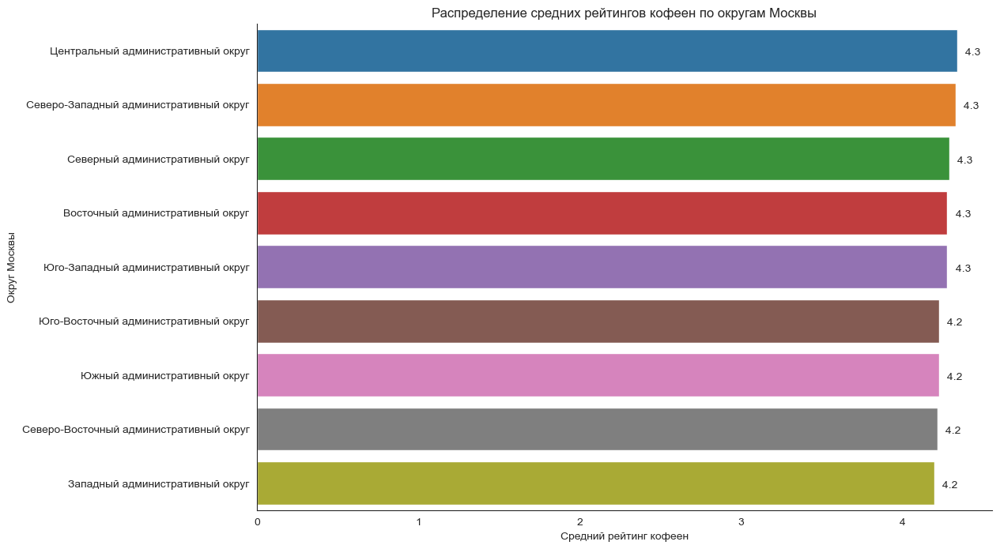

In [115]:
# создаем график
plt.figure(figsize = (12,8))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'rating', 
                 y = 'district',
                 data = coffee_shop_ratings_by_dist
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Распределение средних рейтингов кофеен по округам Москвы')
plt.xlabel('Средний рейтинг кофеен')
plt.ylabel('Округ Москвы')

# добавляем стикеры значений к столбцам
for p in ax.patches :
 _x = p. get_x () + p. get_width () + float(0.05)
 _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
 value = '{:.1f} '. format (p. get_width ())
 ax.text (_x, _y, value, ha= 'left')


# выводим результат
plt.show()

Посмотрим так-же как это выглядит на карте построив фоновую картограмму (хороплет).

In [116]:
# создаём карту Москвы
m6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_shop_ratings_by_dist,
    columns=['district_id', 'rating'],
    key_on='feature.id',
    fill_color='Blues',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по округам Москвы',
).add_to(m6)

# выводим карту
m6

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 
    
- Средний рейтинг кофеен в Москве равен 4.28;
- В целом рейтинги кофеен в Москве довольно высокие и ровные и колеблются лишь в небольшом диапазоне от 4.2 до 4.34;
- Максимальный рейтинг - 4.34 у кофеен, расположенных в *Центральном* округе;
- У идущего на втором месте *Северо-западного* округа рейтинг кофеен почти такой-же - 4.33;
- Вслед за двумя лидерами следуют три округа - *Северный*, *Восточный* и *Юго-западный* - у которых рейтинги чуть ниже, чем   у лидеров и практически совпадают между собой - 4.28-4.29;
- Далее идут так-же три округа - *Юго-восточный*, *Южный* и *Северо-восточный* - с рейтингами 4.22-4.23;
- Замыкает список *Западный* округ, в котором кофейни имеют самый маленьких рейтинг - 4.20.

### На какую стоимость чашки капучино стоит ориентироваться при открытии ?  <a id='step_4.4'></a>

Для начала на основе столбца "middle_coffee_cup" датафрейма cofe_shops посчитаем среднюю цену чашки капучино в кофейнях Москвы.

In [117]:
# вычисляем общую среднюю цену чашки капучино в кофейнях по столбцу 'middle_coffee_cup'
avg_cup_price_tot = round( coffee_shops['middle_coffee_cup'].mean(), 0)

# выводим результат
print( "Средняя цена чашки капучино в кофейнях Москвы равна", avg_cup_price_tot, "рублей")

Средняя цена чашки капучино в кофейнях Москвы равна 175.0 рублей


Сгруппируем теперь кофейни по округам Москвы и посчитаем среднее значение цены чашки капучино в разбивке по округам.

In [118]:
# группируем данные по округам и берем среднюю цену чашки капучино
avg_cup_price_by_dist = coffee_shops.groupby('district', as_index=False) \
                                    .agg({'middle_coffee_cup': 'mean'}) \
                                    .round(0) \
                                    .sort_values('middle_coffee_cup',ascending=False)

# смотрим что получилось (c градиентом)
avg_cup_price_by_dist[['district', 'middle_coffee_cup']].style.background_gradient('Blues')

,district,middle_coffee_cup
1,Западный административный округ,190.000000
5,Центральный административный округ,188.000000
7,Юго-Западный административный округ,184.000000
0,Восточный административный округ,174.000000
2,Северный административный округ,166.000000
4,Северо-Западный административный округ,166.000000
3,Северо-Восточный административный округ,165.000000
8,Южный административный округ,158.000000
6,Юго-Восточный административный округ,151.000000


Визуализируем и это распределение горизонтальной столбчатой диаграммой.

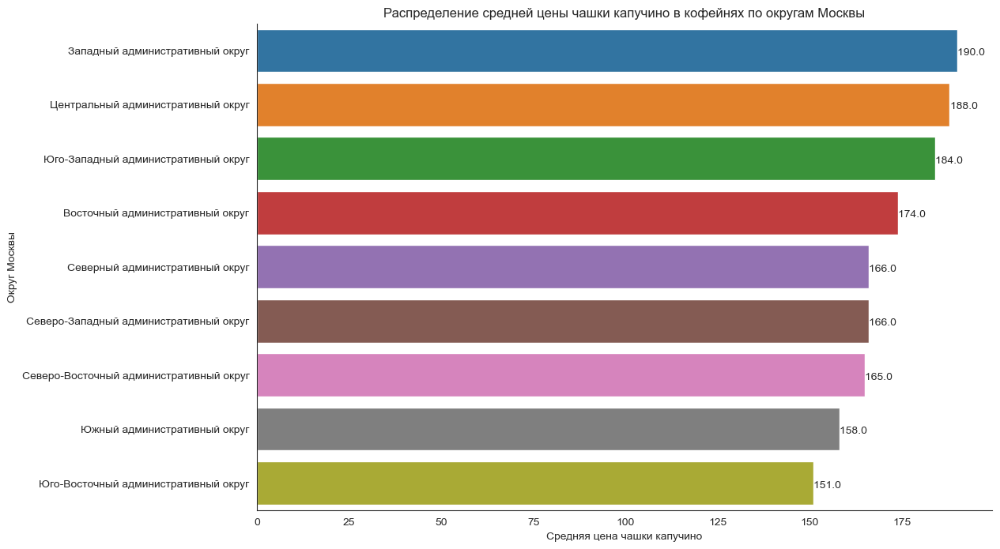

In [119]:
# создаем график
plt.figure(figsize = (12,8))
sns.set_style('white')

# строим горизонтальную столбчатую диаграмму 
ax = sns.barplot(x = 'middle_coffee_cup', 
                 y = 'district',
                 data = avg_cup_price_by_dist
                )

# оформляем график
sns.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)
plt.title('Распределение средней цены чашки капучино в кофейнях по округам Москвы')
plt.xlabel('Средняя цена чашки капучино')
plt.ylabel('Округ Москвы')

# добавляем стикеры значений к столбцам
for p in ax.patches :
 _x = p. get_x () + p. get_width () + float(0.05)
 _y = p. get_y () + p. get_height () - (p. get_height () * 0.4)
 value = '{:.1f} '. format (p. get_width ())
 ax.text (_x, _y, value, ha= 'left')


# выводим результат
plt.show()

<div style="border:solid #d9d9d9 2px; padding: 10px"> 

**Видим, что:** 
    
- Средняя цена чашки капучино в кофейнях Москвы равна с хорошей точностью 175 рублей;
- В целом цена чашки капучино колеблется от округа к округу в пределах от 151 до 190 рублей;
- Максимальная цена чашки - 190 рублей у кофеен, расположенных в *Восточном* округе;
- У идущего на втором месте *Центрального* округа цена чашки капучино в кофейнях ниже всего на 2 рубля - 188 рублей;
- Еще на 4 рубля ниже стоимость чашки капучино в кофейнях *Юго-Западного* округа;
- Далее спад по цене становится более заметным: в кофейнях *Восточного* округа чашка капучино стоит уже 174 рубля;
- В трех северных округах - *Северном*, *Северо-западном* и *Северо-восточном* цены в кофейнях еще ниже и практически одинаковы между собой - 165-166 рублей;
- Кофейни *Южного* округа еще более демократичны - на территории этого округа цена чашки капучино равна 158 рублей;
- Самый дешевый капучино в Москве в кофейнях *Юго-восточного* округа - 151 рубль. То есть разница с "лидером" - *Западным* округом составляет 39 рублей, то есть больше четверти цены.

Перед тем как делать выводы (чтобы они были нагляднее и под рукой) - соберем всю предыдущую информацию в одной табличке.

In [120]:
# передаем новой табличке данные по общему количеству кофеен в округе
coffee_shops_all_by_dist = coffee_shops_by_dist[['district','name']].sort_values('district')
coffee_shops_all_by_dist.columns = ['district', 'obj_total']

# передаем данные по количеству кофеен 24 на 7 в округе
coffee_shops_all_by_dist['obj_24_7'] = coffee_shops_24_7_by_dist.sort_values('district')['name']

# передаем данные по рейтингу кофеен в округе
coffee_shops_all_by_dist['rating'] = coffee_shop_ratings_by_dist.sort_values('district')['rating']

# передаем данные по цене чашки капучино в кофейнях округа
coffee_shops_all_by_dist['middle_coffee_cup'] = avg_cup_price_by_dist.sort_values('district')['middle_coffee_cup']

# добавляем строку с агрегированными данными по всем округам Москвы
coffee_shops_all_by_dist.loc[ len(coffee_shops_all_by_dist.index )] = ["Всего по Москве", \
                                                                       len(coffee_shops), \
                                                                       len(coffee_shops_24_7), \
                                                                       coffee_shop_rating_tot, \
                                                                       avg_cup_price_tot ]


# смотрим что получилось (c градиентом)
coffee_shops_all_by_dist.style.background_gradient('Blues')

,district,obj_total,obj_24_7,rating,middle_coffee_cup
0,Восточный административный округ,105,5,4.280000,174.000000
1,Западный административный округ,150,9,4.200000,190.000000
2,Северный административный округ,193,5,4.290000,166.000000
3,Северо-Восточный административный округ,159,3,4.220000,165.000000
4,Северо-Западный административный округ,62,2,4.330000,166.000000
5,Центральный административный округ,428,26,4.340000,188.000000
6,Юго-Восточный административный округ,89,1,4.230000,151.000000
7,Юго-Западный административный округ,96,7,4.280000,184.000000
8,Южный административный округ,131,1,4.230000,158.000000
9,Всего по Москве,1413,59,4.280000,175.000000


## Рекомендации по открытию кофейни: <a id='recommendations'></a>

<div style="border:solid #d9d9d9 5px; padding: 10px"> 

##### По результатам исследования ранка кофеен в Москве можно рекомендовать следующее:

**1.** Необходимо иметь ввиду, что кофейни входят в тройку самых популярных заведений общественного питания в Москве. В процессе открытия нужно будет уделить достаточно внимания концепции, его месторасположению и маркетинговой политике, чтобы "выделяться" на фоне конкурентов. 
    
**2.** Наиболее распространенный формат кофеен с точки зрения количества посадочных мест - это заведение с 80 местами. Однако в этом плане все сильно будет зависеть от фактического выбора места.
    
**3.** Стоит так-же иметь ввиду, что средняя стоимость чашки капучино в Москве варьируется от 150 до 190 рублей в зависимости от месторасположения кофейни. Это значит, что по всей вероятности возможности варьировать цены будут ограничены ближайшими конкурентами в диапазоне плюс минус 5 рублей.
    
**4.** С точки зрения района возможного расположения кофейни есть смысл обратить внимание на западную часть мегаполиса:
    
    - Прежде всего интересен Западный округ:  
        - общее количество кофеен в этом районе имеет "простор для роста". Округ занимает лишь 4-е место по этому  показателю, уступая не только Центральному, но и Северному и Северо-восточному округу, которые не опережают Западный округ ни по территории, ни по уровню деловой активности, ни по "престижности",             
        - по всей видимости спрос здесь максимально опережает предложение, поскольку стоимость чашки капучино в этом районе - самая высокая в Москве. Это дает возможность вести более гибкую ценовую политику заведения, особенно на начальном этапе,         - рейтинги кофеен в этом районе самые низкие в Москве. Это означает, что при обеспечении высокого качества продукции и уровня обслуживания с точки зрения конкуренции будет легче "встать на ноги" и обеспечить себе имя.
   
    - Так-же интересен и Юго-западный округ по тем же соображениям:
        - общее количество кофеен зздесь ниже, чев в Западном округе, рейтинг заведений совсем немногим выше, чем в Западном округе, а стоимоть чашки капучино - совсем немного ниже.
    
    - Третьим по привлекательности есть смысл рассматривать Северо-западный округ:
        - в отличие от соседей здесь расположены заведения с боле высоким рейтингом, а цена чашки капучино в них - поэтому с точки зрения ценовой политики и качества обслуживания ситуацию будет более конкурентная, но зато общее количество кофеен в этом районе самое низкое в Москве и меньше, чем у двух других описанных округов практически в два раза. Это создает возможности найти в округе такое место раположения нового заведения, которое будет достаточно выгодным для компенсации указанных "недостатков".
    - Можно так-же рассматривать Центральный округ, однако нужно иметь ввиду высокую конкуренцию среди кофеен в этом округе, учитывать достаточно большую долю мощных сетевых игроков (таких как Шоколадница) и высокие рейтинги заведений в этом округе. Все это зставляет очень тщательно продумывать формат заведения, квалификацию персонала и выбирать место расположения будущей кофейни.
    
**5.** При выборе конкретного места размещения новой кофейни необходимо оценить конкретное место не только по "техническим" параметрам ( транспортной доступности, цены аренды и т.п.) но и параметрам проходимости места и наличия конкурентов в ближайшем окружении. Нужно иметь ввиду, что в каждом округе Москвы довольно много улиц, на которых расположено либо одно заведение общественного питания, либо нет вовсе ни одного. Если среди таких улиц найти улицу с достаточно высокой проходимостью - это может дать изначально большое преимущество для развития новой кофейни.
    
**6.** В случае нахождения подходящего места есть смысл подумать над организацией круглосуточного режима работы кофейни. Доля круглосуточно работающих заведений этой категории в Москве довольно мала и большинство из них расположены в Центральном округе. В округах, которые мы отмечали ранее количество таких кофеен исчисляется единицами. Такой режим работы может создать весомое преимущество новому заведению за счет привлечения клиентов в "нерабочие" часы.


## Презентация результатов исследования  <a id='presentation'></a>

Презентация результатов в формате .pdf находится по ссылке: https://disk.yandex.ru/i/Fr28dhHX7NRO-Q

#### Проект выполнил Александр Кийко.
##### a.m.kiyko@yandex.ru

<div class="alert alert-success">
<b>✔️ Итоговый комментарий ревьюера v2:</b>
<br>Спасибо тебе за отличный проект!
<br>Я рад был поработать над проверкой твоей работы. 
<br>Поздравляю со сдачей проекта и желаю удачи в дальнейшем обучении! 😉    
</div>